In [1]:
# Import necessary modules

import pandas as pd
import nltk
from nltk.corpus import stopwords
import re
import glob
import os
from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer
from transformers import AutoModel, AutoTokenizer
from sklearn.preprocessing import LabelEncoder

In [2]:
''' This code is used to load all the datasets for the analysis. The cleaned datasets are located within the folder
drug reac age group'''

### Load the datasets

# Define the base paths for all medicine
base_paths = [
    'drugs reac age group/canagliflozin',
    'drugs reac age group/dapagliflozin',
    'drugs reac age group/dulaglutide',
    'drugs reac age group/empagliflozin',
    'drugs reac age group/exenatide',
    'drugs reac age group/insulin_glargine',
    'drugs reac age group/insulin_lispro',
    'drugs reac age group/nph_insulin',
    'drugs reac age group/semaglutide',
]

# define medicine names corresponding to base_path
medicine_names = [
    'Canagliflozin',
    'Dapagliflozin',
    'Dulaglutide',
    'Empagliflozin',
    'Exenatide',
    'Insulin_glargine',
    'Insulin_lispro',
    'NPH_insulin',
    'Semaglutide'
]

# initialise an empty list to store dataframes 
all_datasets = []

# Loop through each base path and medicine name
for base_path, medicine_name in zip(base_paths, medicine_names):
    # Define the file pattern to match the datasets for the current medicine
    file_pattern = os.path.join(base_path, f'{medicine_name.lower()}_reac_demo_*.csv')

    # Get the list of file paths sorted by year
    file_paths = sorted(glob.glob(file_pattern), key=lambda x: int(os.path.basename(x).split('_')[-1].split('.')[0]))

    # Load the datasets for the current medicine into a list of dataframes
    datasets = [pd.read_csv(file_path) for file_path in file_paths]

    # Add a 'medicine' column to each dataset
    for df in datasets:
        df['medicine'] = medicine_name

    # Append the datasets to the all_datasets list
    all_datasets.extend(datasets)

# Filter out all empty dataframes before concatenation
all_datasets = [df for df in all_datasets if not df.empty]

# Concatenate all datasets into a single dataframe
combined_df = pd.concat(all_datasets, ignore_index=True)

# Display the concatenated dataframe
print(f"Total datasets concatenated: {len(all_datasets)}")
print(f"Combined dataset sample: \n{combined_df.head()}")

/var/folders/ld/dl450hd568j5wxpfd5d84y340000gn/T/ipykernel_29867/692136332.py:42: DtypeWarning: Columns (10,12,23) have mixed types. Specify dtype option on import or set low_memory=False.
  datasets = [pd.read_csv(file_path) for file_path in file_paths]


Total datasets concatenated: 82
Combined dataset sample: 
   primaryid   caseid  drug_seq role_cod       drugname  val_vbm route  \
0   93001441  9300144         1       PS  CANAGLIFLOZIN        1  ORAL   
1   93001441  9300144         2       SS  CANAGLIFLOZIN        1  ORAL   
2   92217513  9221751         1       PS  CANAGLIFLOZIN        1  ORAL   
3   92217513  9221751         2       SS  CANAGLIFLOZIN        1  ORAL   
4   92642123  9264212         1       PS  CANAGLIFLOZIN        1  ORAL   

  dose_vbm  cum_dose_chr cum_dose_unit  ...  year quarter age_group  \
0      NaN           NaN           NaN  ...  2013      Q2   Elderly   
1      NaN           NaN           NaN  ...  2013      Q2   Elderly   
2      NaN           NaN           NaN  ...  2013      Q3   Elderly   
3      NaN           NaN           NaN  ...  2013      Q3   Elderly   
4      NaN           NaN           NaN  ...  2013      Q3     Adult   

        medicine  prod_ai  drug_rec_act auth_num lit_ref age_grp  sex 

In [3]:
# Check if there is any missing reaction values in column 'pt'
combined_df['pt'].isna().sum()

0

In [4]:
# Initialize the BERTopic model with custom vectorizer and embeddings
# Several preprocessing steps are done here including lowercasing, stopwords removing, tokenising, and punctuation removing.
embedding_model = AutoModel.from_pretrained("emilyalsentzer/Bio_ClinicalBERT")
tokenizer = AutoTokenizer.from_pretrained("emilyalsentzer/Bio_ClinicalBERT")
topic_model = BERTopic(
    embedding_model=(embedding_model,tokenizer),
    vectorizer_model=CountVectorizer(
        stop_words='english',
        token_pattern=r"(?u)\b[A-Za-z]+\b"
    ),
    min_topic_size=100,
    n_gram_range=(1, 1)
)

In [5]:
'''
This function is used to iteratively fit the BERTopic model to all the medicines dataset.
Note that the number of topics is initially set to 20
'''

def process_medicine(medicine, combined_df, topic_model):
    print(f"Processing topics for {medicine}...")
    
    # Filter data for the current medicine
    medicine_df = combined_df[combined_df['medicine'] == medicine]
    
    # Prepare texts and age groups
    texts = medicine_df['pt'].dropna().tolist()  # Convert 'pt' to list
    age_groups = medicine_df['age_group'].dropna().tolist()  # Convert 'age_group' to list

    # Ensure the lists have matching lengths
    if len(texts) != len(age_groups):
        print(f"Skipping {medicine} due to mismatched text and age group data.")
        return medicine, None  # Return None for this medicine
    
    # Check that inputs to LabelEncoder are valid
    try:
        label_encoder = LabelEncoder()
        age_group_labels = label_encoder.fit_transform(age_groups)  # Encode age groups
    except Exception as e:
        print(f"Error encoding age groups for {medicine}: {e}")
        return medicine, None

    # Fit the BERTopic model
    try:
        topics, probabilities = topic_model.fit_transform(texts, y=age_group_labels)
    except Exception as e:
        print(f"Error fitting BERTopic model for {medicine}: {e}")
        return medicine, None
    
    # Reduce the number of topics to 20
    topic_model.reduce_topics(texts, nr_topics=20)

    # Get topic information
    topic_info = topic_model.get_topic_info()

    print(f"Finished processing topics for {medicine}.")
    
    # Return the results
    return medicine, {
        "topics": topics,
        "probabilities": probabilities,
        "topic_info": topic_info,
        "model": topic_model
    }


In [6]:
'''
This code is used to run the process_medicine function using joblib parallelisation to speed up the process
by distributing the workload across multiple CPU cores
'''

from joblib import Parallel, delayed
import warnings
from sklearn.preprocessing import LabelEncoder

os.environ["OMP_DISPLAY_ENV"] = "FALSE"

# List of medicines
medicines = combined_df['medicine'].unique()

warnings.filterwarnings("ignore", category=RuntimeWarning, message="omp_set_nested routine deprecated")
# Parallelize processing with joblib
results = Parallel(n_jobs=-1)(delayed(process_medicine)(medicine, combined_df, topic_model) for medicine in medicines)

# Convert results to a dictionary
medicine_topics = {medicine: result for medicine, result in results if result is not None}

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


Processing topics for Exenatide...
Finished processing topics for Exenatide.
Processing topics for Semaglutide...
Finished processing topics for Semaglutide.
Processing topics for Dulaglutide...
Finished processing topics for Dulaglutide.
Processing topics for Canagliflozin...
Finished processing topics for Canagliflozin.
Processing topics for NPH_insulin...
Finished processing topics for NPH_insulin.
Processing topics for Empagliflozin...
Finished processing topics for Empagliflozin.
Processing topics for Insulin_lispro...
Finished processing topics for Insulin_lispro.
Processing topics for Dapagliflozin...
Finished processing topics for Dapagliflozin.


In [7]:
# Displaying the topics
for medicine, data in medicine_topics.items():
    print(f"\nTopics for {medicine}:")
    print(data['topic_info'])


Topics for Canagliflozin:
    Topic  Count                                               Name  \
0      -1   8601               -1_increased_infection_drug_disorder   
1       0   1635            0_mellitus_diabetes_hyperglycaemia_type   
2       1    658                        1_asthma_wheezing_sneezing_   
3       2    640                    2_joint_urinary_tract_ankylosis   
4       3    484      3_pressure_hypertension_diastolic_fluctuation   
5       4    470                            4_count_abnormal_blood_   
6       5    460                5_gastrooesophageal_reflux_disease_   
7       6    427           6_nausea_vomiting_dizziness_palpitations   
8       7    226                    7_label_use_product_prescribing   
9       8    212                       8_fatigue_fall_muscle_spasms   
10      9    195                        9_kidney_acute_injury_renal   
11     10    187        10_dyspnoea_exertional_underdose_tachypnoea   
12     11    152                      11_diarrhoea

In [8]:
'''
This function is used to calculate entropy and variance to be used in topic validation
'''

import numpy as np
from scipy.stats import entropy

def calculate_metrics_for_medicines(medicine_topics):
    """
    Calculate topic metrics (entropy and variance) for each medicine's topic model.

    Args:
        medicine_topics (dict): Dictionary with medicine names as keys and topic model details as values.

    Returns:
        metrics_by_medicine (dict): Dictionary containing metrics for each medicine.
    """
    metrics_by_medicine = {}

    for medicine, result in medicine_topics.items():
        topic_model = result["model"]

        print(f"Calculating metrics for {medicine}...")
        topics = topic_model.get_topics()
        metrics = []

        for topic_id, topic_words in topics.items():
            if topic_id == -1:  # Skip the outlier topic
                continue

            # Extract word probabilities
            probabilities = np.array([weight for _, weight in topic_words])
            probabilities /= probabilities.sum()  # Normalize to get a probability distribution

            # Calculate entropy and variance
            topic_entropy = entropy(probabilities)
            topic_variance = np.var(probabilities)

            metrics.append({
                "topic_id": topic_id,
                "entropy": topic_entropy,
                "variance": topic_variance
            })

        metrics_by_medicine[medicine] = metrics

    return metrics_by_medicine

In [9]:
'''
This function is used to filter topics. Note that the entropy threshold is set to 1.5 and variance threshold is set to 0.01
'''

def filter_topics_for_medicines(metrics_by_medicine, entropy_threshold=1.5, variance_threshold=0.01):
    """
    Filters topics for each medicine based on entropy and variance thresholds.

    Args:
        metrics_by_medicine (dict): Dictionary containing metrics for each medicine.
        entropy_threshold (float): Maximum allowed entropy for a valid topic.
        variance_threshold (float): Minimum required variance for a valid topic.

    Returns:
        filtered_topics (dict): Dictionary with valid and invalid topics for each medicine.
    """
    filtered_topics = {}

    for medicine, metrics in metrics_by_medicine.items():
        valid_topics = []
        invalid_topics = []

        for metric in metrics:
            if metric["entropy"] <= entropy_threshold and metric["variance"] >= variance_threshold:
                valid_topics.append(metric["topic_id"])
            else:
                invalid_topics.append(metric["topic_id"])

        filtered_topics[medicine] = {
            "valid_topics": valid_topics,
            "invalid_topics": invalid_topics
        }

    return filtered_topics

Processing topics for Insulin_glargine...
Finished processing topics for Insulin_glargine.


In [10]:
'''
This is the entorpy calculation process, the output is valid topics and invalid topics based on the entropy threshold
'''


# Step 1: Calculate topic metrics for each medicine
topic_metrics_by_medicine = calculate_metrics_for_medicines(medicine_topics)

# Step 2: Filter valid and invalid topics for each medicine
filtered_topics = filter_topics_for_medicines(topic_metrics_by_medicine)

# Step 3: Print results
for medicine, topics in filtered_topics.items():
    print(f"Medicine: {medicine}")
    print(f"Valid Topics: {topics['valid_topics']}")
    print(f"Invalid Topics: {topics['invalid_topics']}")
    print("-" * 40)

Calculating metrics for Canagliflozin...
Calculating metrics for Dapagliflozin...
Calculating metrics for Dulaglutide...
Calculating metrics for Empagliflozin...
Calculating metrics for Exenatide...
Calculating metrics for Insulin_glargine...
Calculating metrics for Insulin_lispro...
Calculating metrics for NPH_insulin...
Calculating metrics for Semaglutide...
Medicine: Canagliflozin
Valid Topics: [1, 4, 5, 10, 11, 12, 16, 17, 18]
Invalid Topics: [0, 2, 3, 6, 7, 8, 9, 13, 14, 15]
----------------------------------------
Medicine: Dapagliflozin
Valid Topics: [9, 12, 13, 14, 17]
Invalid Topics: [0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 15, 16, 18]
----------------------------------------
Medicine: Dulaglutide
Valid Topics: [4, 5, 6, 7, 11, 12]
Invalid Topics: [0, 1, 2, 3, 8, 9, 10, 13]
----------------------------------------
Medicine: Empagliflozin
Valid Topics: [6, 7, 9, 12, 13, 14, 15, 16, 17, 18]
Invalid Topics: [0, 1, 2, 3, 4, 5, 8, 10, 11]
----------------------------------------
Medicin

In [11]:
'''
This code is used to remove the invalid topics
'''

for medicine, topics in filtered_topics.items():
    topic_model = medicine_topics[medicine]["model"]
    invalid_topics = topics["invalid_topics"]

    # Merge invalid topics into a single "outlier" topic
    for invalid_topic in invalid_topics:
        topic_model.merge_topics(combined_df[combined_df["medicine"] == medicine]["pt"].tolist(), topics_to_merge=[invalid_topic])

    print(f"Invalid topics for {medicine} have been merged or removed.")

Invalid topics for Canagliflozin have been merged or removed.
Invalid topics for Dapagliflozin have been merged or removed.
Invalid topics for Dulaglutide have been merged or removed.
Invalid topics for Empagliflozin have been merged or removed.
Invalid topics for Exenatide have been merged or removed.
Invalid topics for Insulin_glargine have been merged or removed.
Invalid topics for Insulin_lispro have been merged or removed.
Invalid topics for NPH_insulin have been merged or removed.
Invalid topics for Semaglutide have been merged or removed.


In [22]:
'''
This code is used to check if there is overlapping topics by calculating the cosine similarity and set the similarity threshold to 8.5
'''

from sklearn.metrics.pairwise import cosine_similarity

# Get topic embeddings from the BERTopic model
# Ensure you are working with the correct model attribute for embeddings
topic_embeddings = topic_model.topic_embeddings_

# Filter embeddings for valid topics (excluding -1 for outliers and invalid topics)
valid_topics = [topic for topic in topic_model.get_topics().keys() if topic != -1 and topic not in invalid_topics]
valid_topic_embeddings = [topic_embeddings[topic] for topic in valid_topics]

# Compute cosine similarity matrix
similarity_matrix = cosine_similarity(valid_topic_embeddings)

# Set a similarity threshold
similarity_threshold = 0.85

# Identify overlapping topic pairs
overlapping_pairs = [
    (i, j) for i in range(len(valid_topics))
    for j in range(i + 1, len(valid_topics))
    if similarity_matrix[i, j] > similarity_threshold
]

# Print overlapping topics
if overlapping_pairs:
    print("Overlapping topic pairs:")
    for pair in overlapping_pairs:
        print(f"Topic {valid_topics[pair[0]]} and Topic {valid_topics[pair[1]]} have high similarity.")
else:
    print("No overlapping topics")

No overlapping topics


In [24]:
'''This function is used to get the details of the valid topics'''


def get_valid_topic_details(medicine_topics, filtered_topics):
    """
    Retrieve details of valid topics for each medicine.

    Args:
        medicine_topics (dict): Dictionary containing topic models for each medicine.
        filtered_topics (dict): Dictionary with valid and invalid topics for each medicine.

    Returns:
        valid_topic_details (dict): Dictionary with details of valid topics for each medicine.
    """
    valid_topic_details = {}

    for medicine, topics in filtered_topics.items():
        topic_model = medicine_topics[medicine]["model"]
        valid_topics = topics["valid_topics"]
        
        # Retrieve details of valid topics
        valid_details = {}
        for topic_id in valid_topics:
            words_with_probs = topic_model.get_topic(topic_id)  # List of (word, probability) tuples
            valid_details[topic_id] = words_with_probs

        valid_topic_details[medicine] = valid_details

    return valid_topic_details

In [25]:
# Step 1: Get details of valid topics
valid_topic_details = get_valid_topic_details(medicine_topics, filtered_topics)

# Step 2: Display valid topics for each medicine
for medicine, topics in valid_topic_details.items():
    print(f"Valid Topics for {medicine}:")
    for topic_id, words_with_probs in topics.items():
        print(f"  Topic {topic_id}:")
        for word, prob in words_with_probs:
            print(f"    {word}: {prob:.4f}")
    print("-" * 40)

Valid Topics for Canagliflozin:
  Topic 1:
    asthma: 1.1239
    wheezing: 0.4308
    sneezing: 0.0203
    : 0.0000
    : 0.0000
    : 0.0000
    : 0.0000
    : 0.0000
    : 0.0000
    : 0.0000
  Topic 4:
    count: 0.4522
    abnormal: 0.3698
    blood: 0.2883
    : 0.0000
    : 0.0000
    : 0.0000
    : 0.0000
    : 0.0000
    : 0.0000
    : 0.0000
  Topic 5:
    gastrooesophageal: 0.4950
    reflux: 0.4950
    disease: 0.4463
    : 0.0000
    : 0.0000
    : 0.0000
    : 0.0000
    : 0.0000
    : 0.0000
    : 0.0000
  Topic 10:
    dyspnoea: 2.0260
    exertional: 0.2349
    underdose: 0.1688
    tachypnoea: 0.0949
    accidental: 0.0522
    presyncope: 0.0372
    intussusception: 0.0372
    debridement: 0.0372
    balanoposthitis: 0.0372
    : 0.0000
  Topic 11:
    diarrhoea: 2.3979
    ileus: 0.0824
    dysentery: 0.0484
    : 0.0000
    : 0.0000
    : 0.0000
    : 0.0000
    : 0.0000
    : 0.0000
    : 0.0000
  Topic 12:
    arthralgia: 2.6534
    : 0.0000
    : 0.0000
    : 0.0

Visualizing valid topics for Canagliflozin...


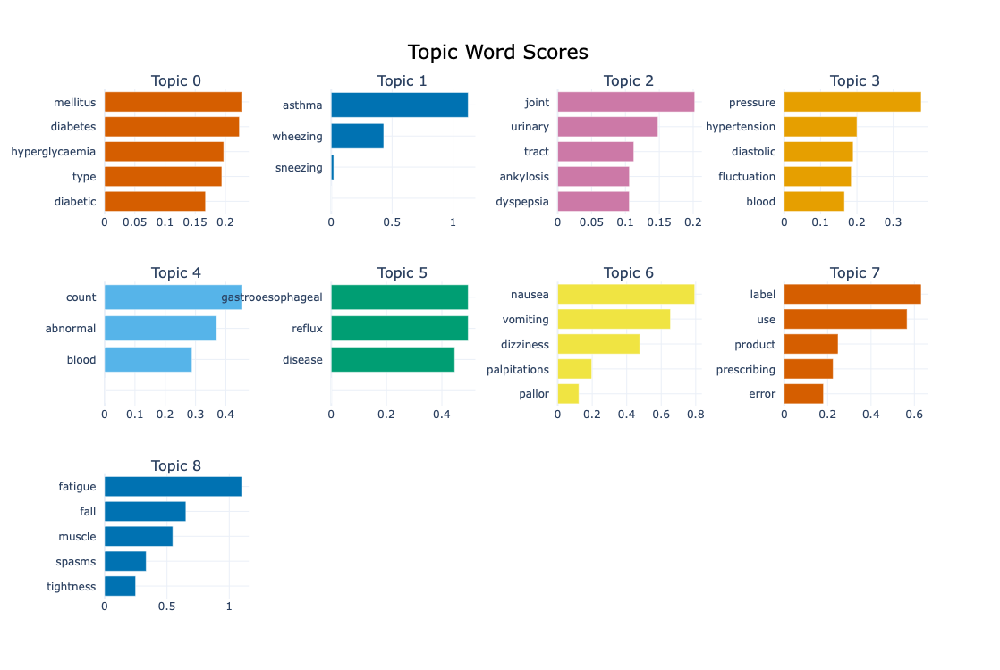

Visualizing valid topics for Dapagliflozin...


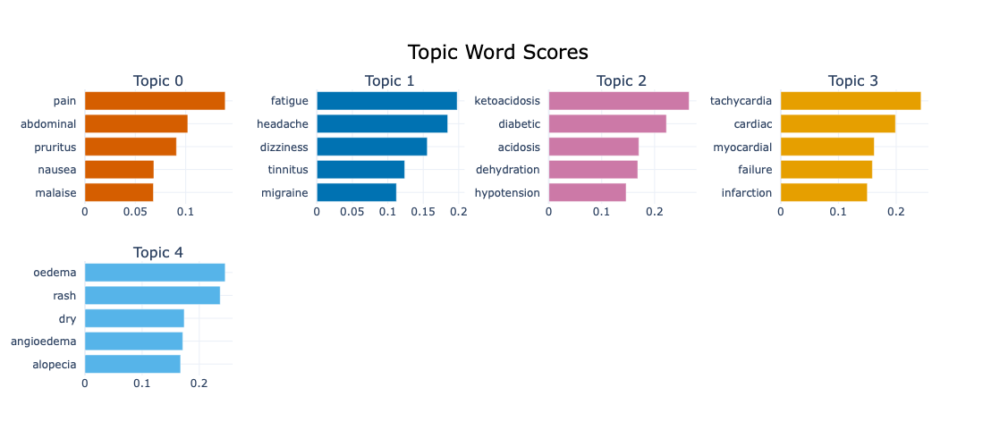

Visualizing valid topics for Dulaglutide...


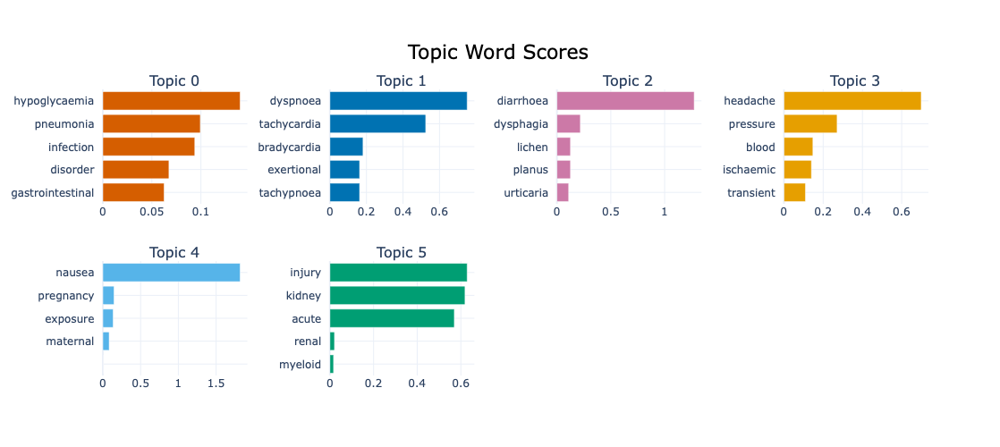

Visualizing valid topics for Empagliflozin...


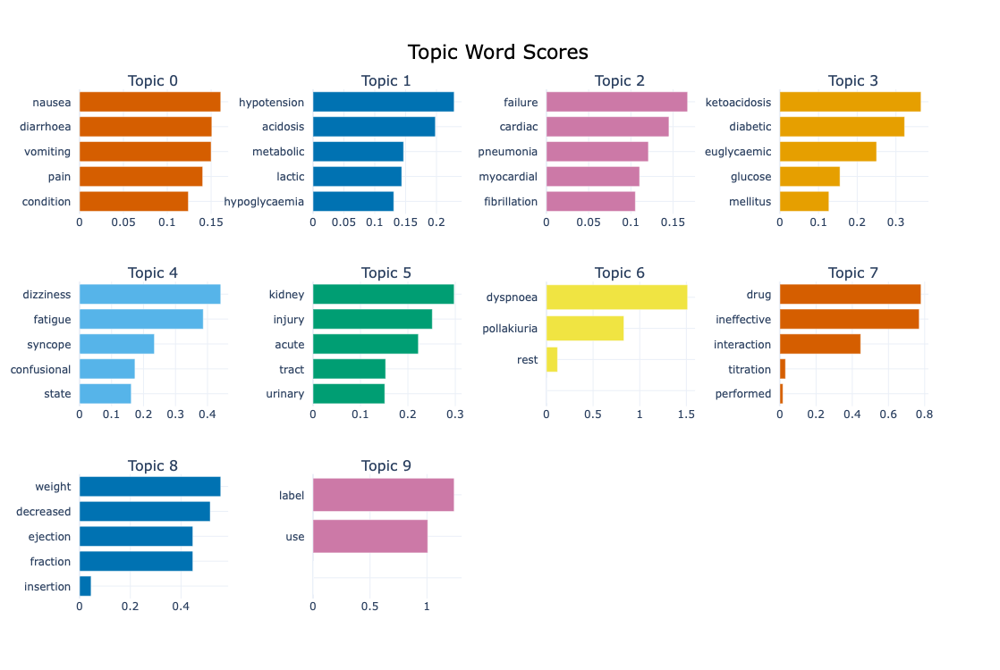

Visualizing valid topics for Exenatide...


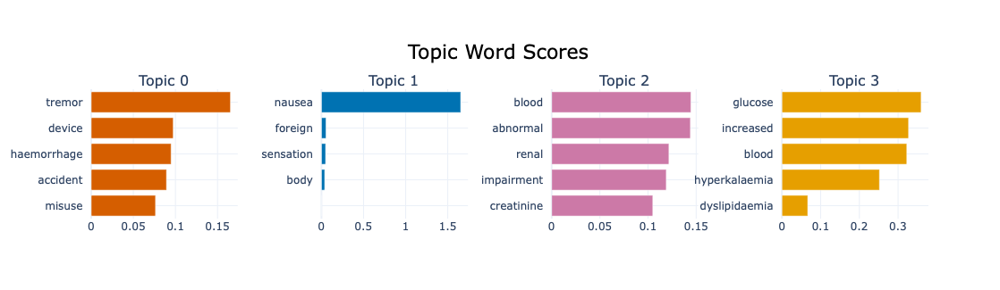

Visualizing valid topics for Insulin_glargine...


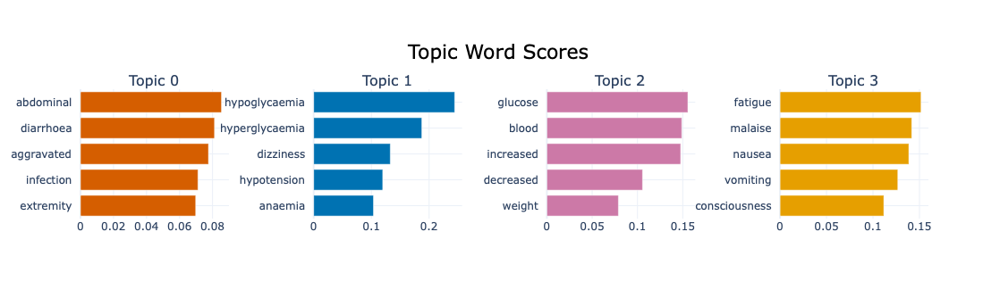

Visualizing valid topics for Insulin_lispro...


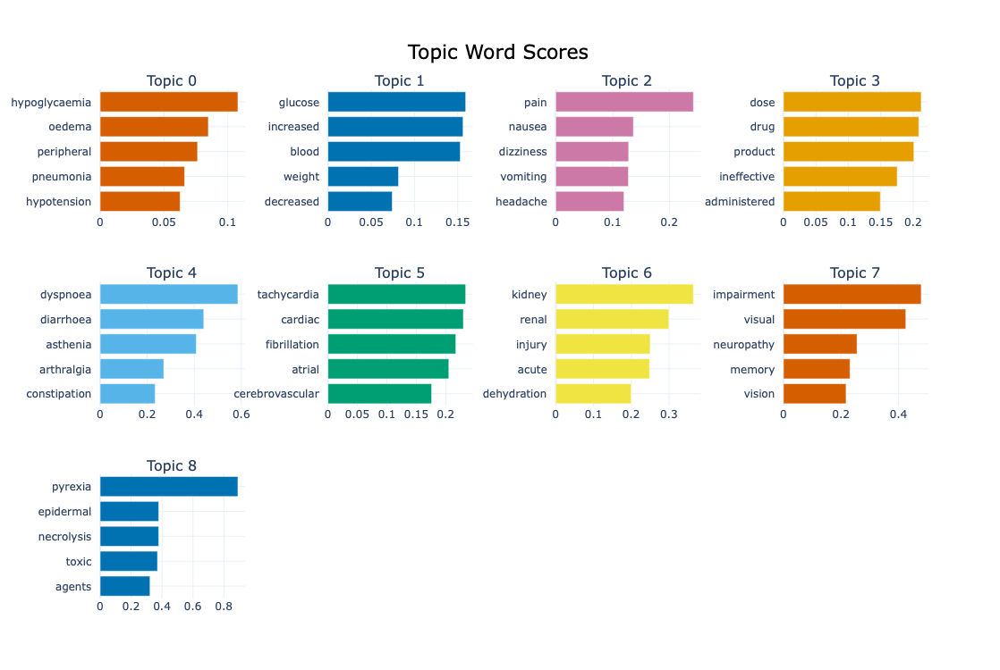

Visualizing valid topics for NPH_insulin...


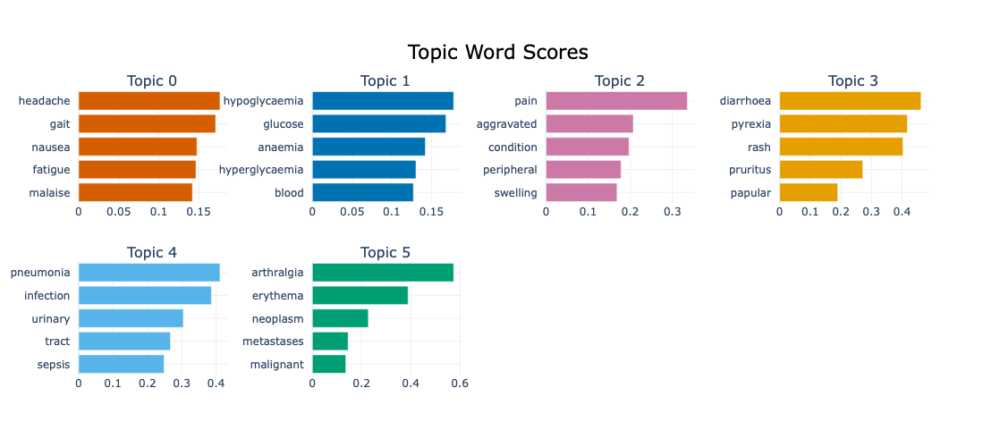

Visualizing valid topics for Semaglutide...


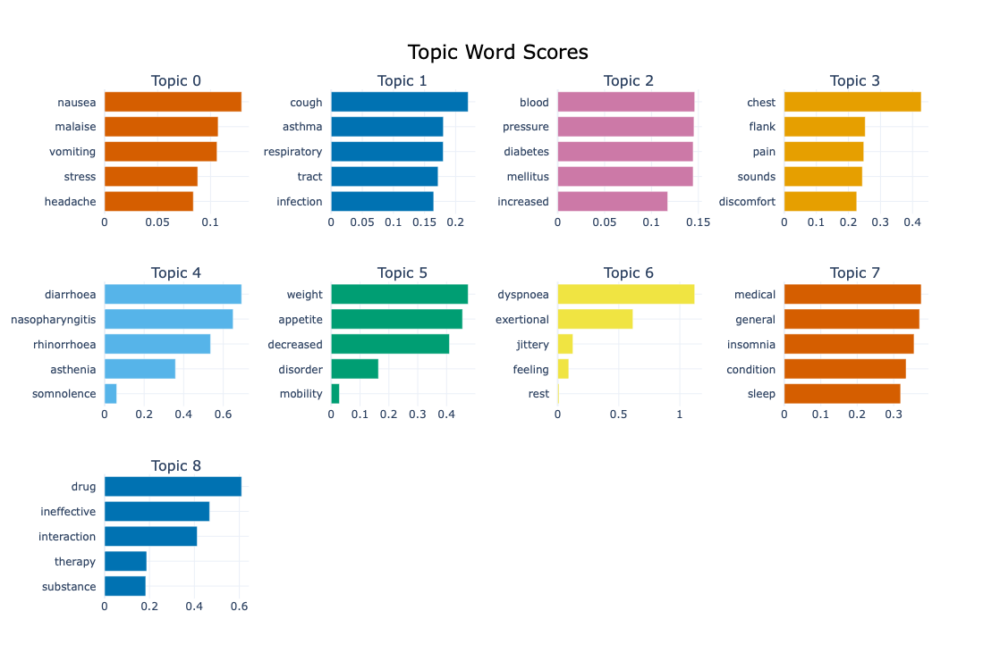

In [26]:
'''
This code is to iteratively visualise topic word scores for all medicine
'''

def visualize_valid_topics_barchart(medicine_topics, filtered_topics):
    """
    Visualize top words for valid topics using BERTopic's visualize_barchart.

    Args:
        medicine_topics (dict): Dictionary containing topic models for each medicine.
        filtered_topics (dict): Dictionary with valid and invalid topics for each medicine.
    """
    for medicine, topics in filtered_topics.items():
        topic_model = medicine_topics[medicine]["model"]
        valid_topics = topics["valid_topics"]

        print(f"Visualizing valid topics for {medicine}...")
        # Use visualize_barchart for valid topics
        fig = topic_model.visualize_barchart(top_n_topics=len(valid_topics), custom_labels=True)
        fig.show()

# Call the function
visualize_valid_topics_barchart(medicine_topics, filtered_topics)

Visualizing valid topics distance for Canagliflozin...


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


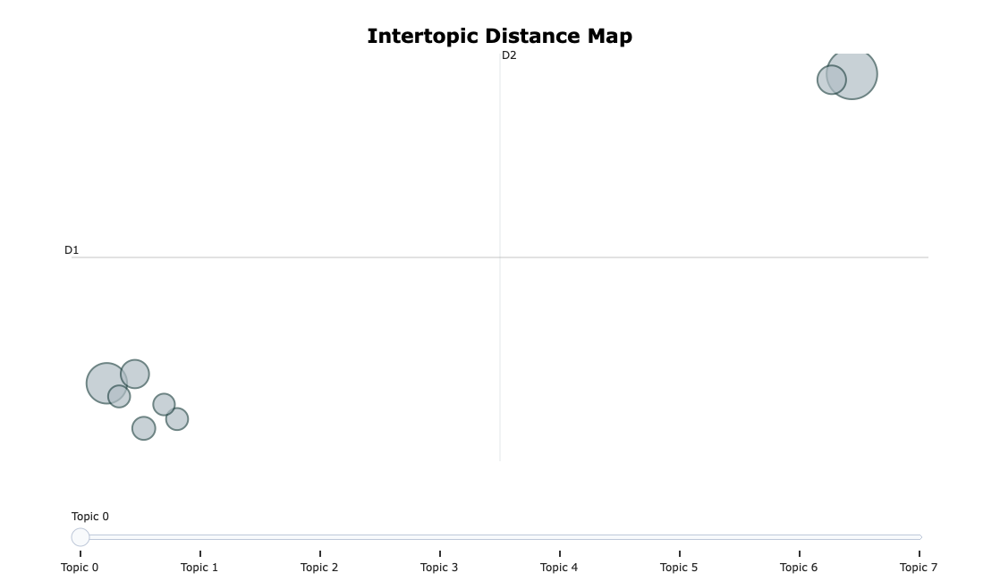

Visualizing valid topics distance for Dapagliflozin...


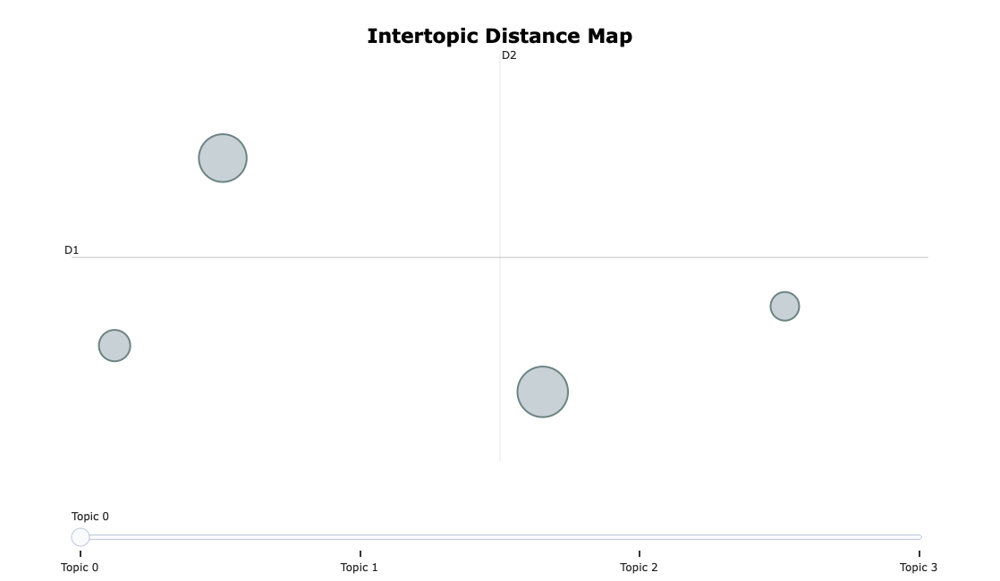

Visualizing valid topics distance for Dulaglutide...


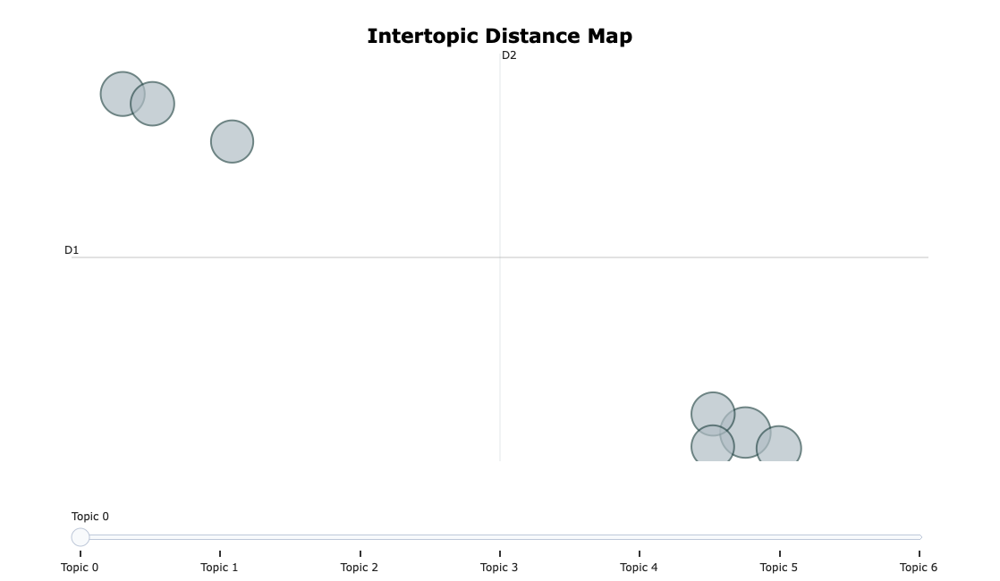

Visualizing valid topics distance for Empagliflozin...


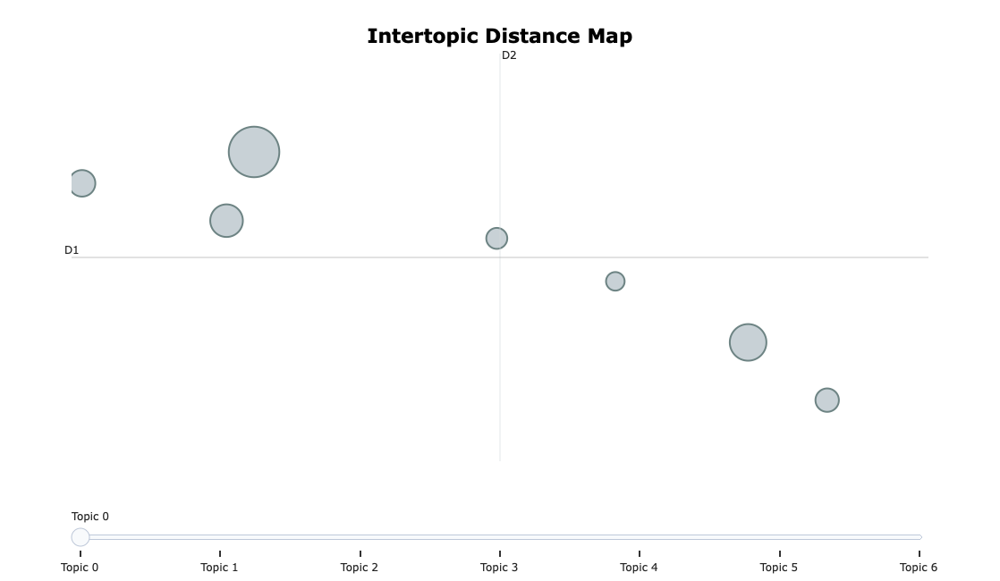

Visualizing valid topics distance for Exenatide...


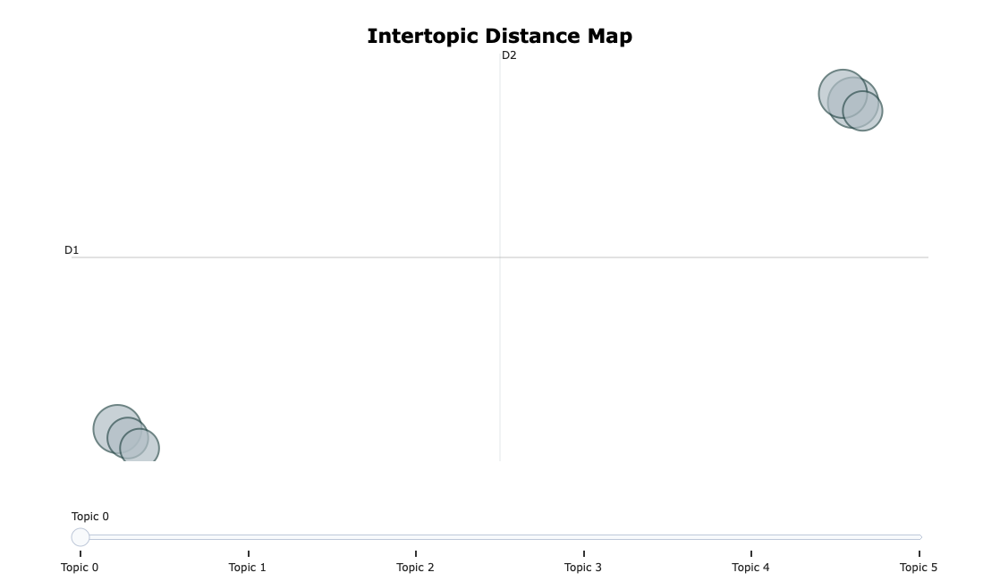

Visualizing valid topics distance for Insulin_glargine...


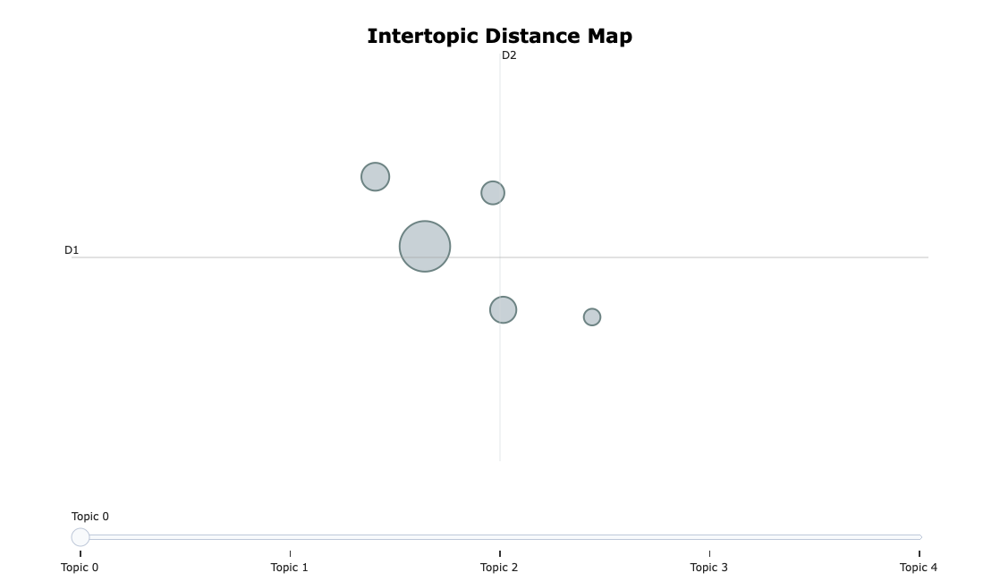

Visualizing valid topics distance for Insulin_lispro...


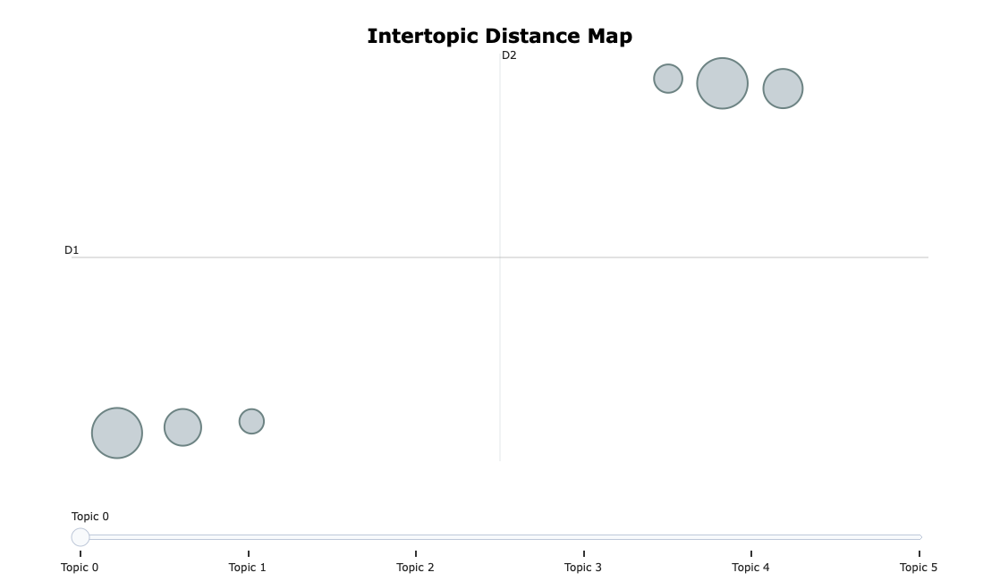

Visualizing valid topics distance for NPH_insulin...


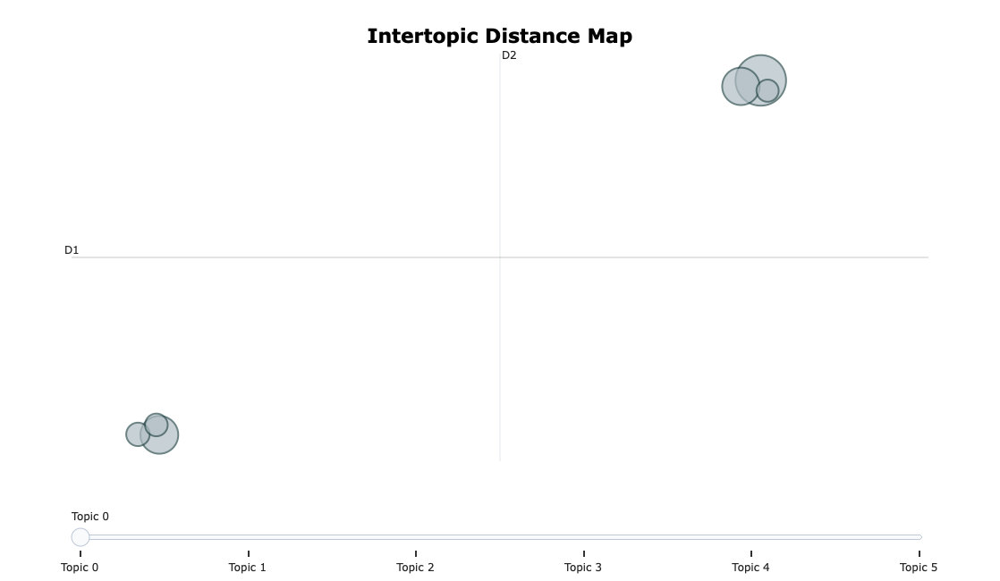

Visualizing valid topics distance for Semaglutide...


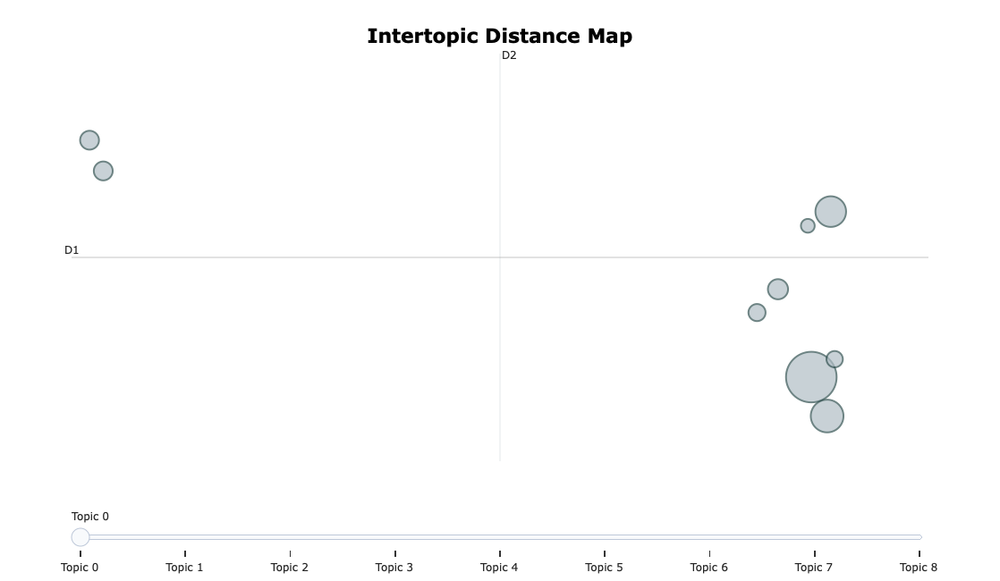

In [30]:
'''
    This code is used to iteratively visualise the intertopic die
'''


def visualize_valid_topics_distance(medicine_topics, filtered_topics):
    """
    Visualize topics distance for valid topics using BERTopic's visualize_topics.

    Args:
        medicine_topics (dict): Dictionary containing topic models for each medicine.
        filtered_topics (dict): Dictionary with valid and invalid topics for each medicine.
    """
    for medicine, topics in filtered_topics.items():
        topic_model = medicine_topics[medicine]["model"]
        valid_topics = topics["valid_topics"]

        print(f"Visualizing valid topics distance for {medicine}...")
        # Use visualize_topics for valid topics
        fig = topic_model.visualize_topics(top_n_topics=len(valid_topics), custom_labels=True)
        fig.show()

# Call the function
visualize_valid_topics_distance(medicine_topics, filtered_topics)

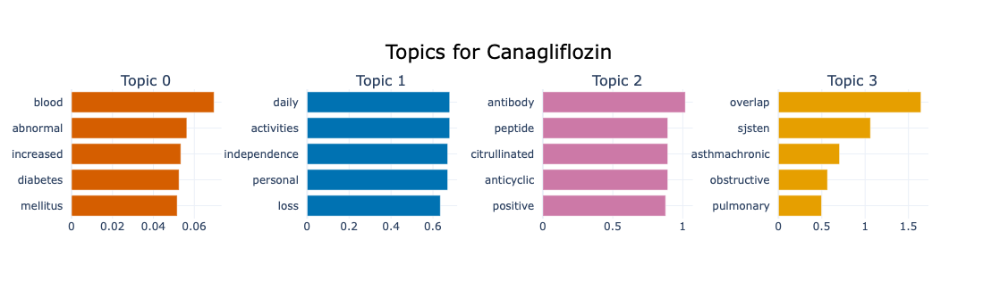

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

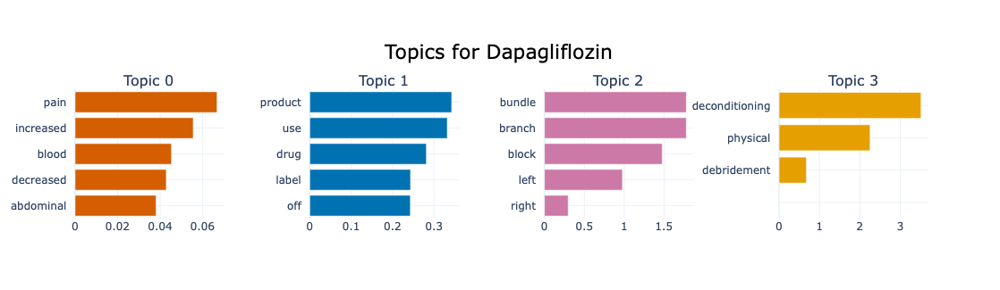

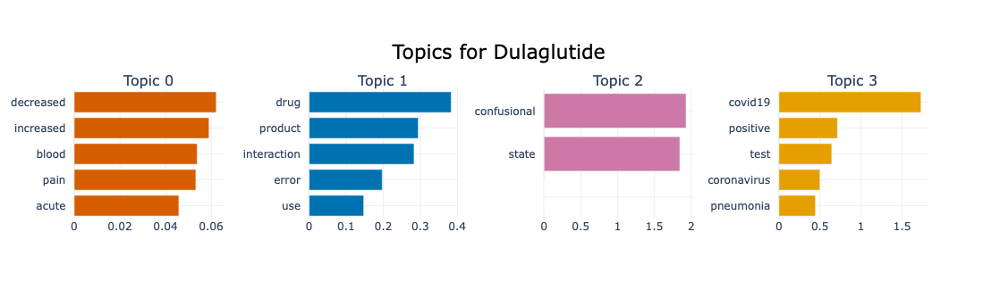

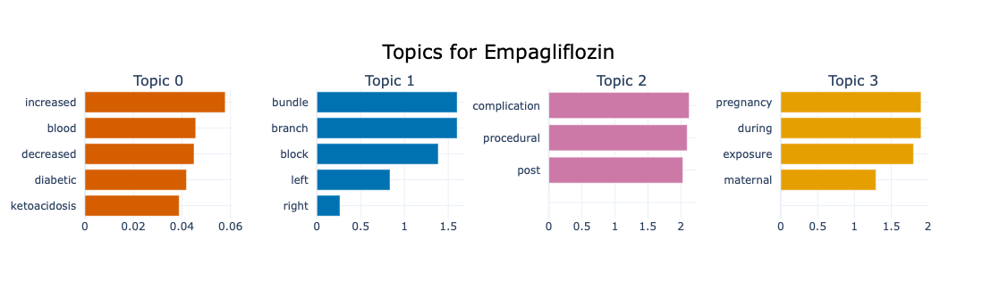

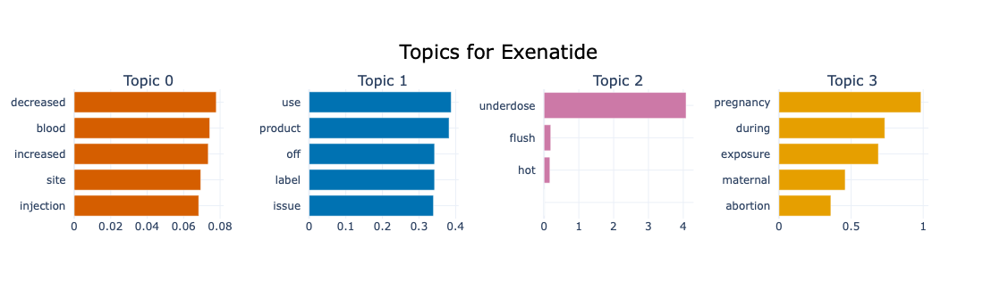

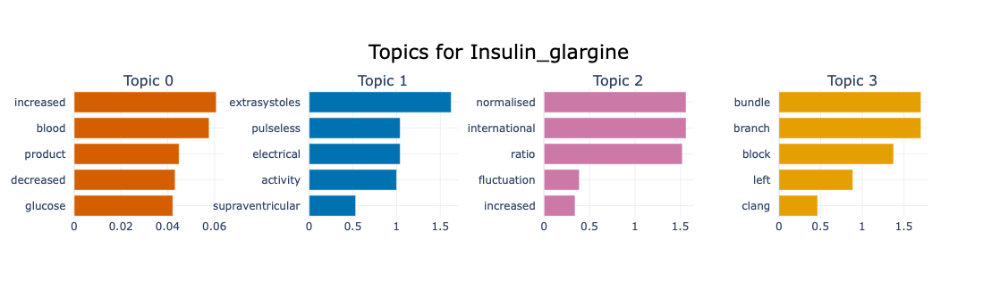

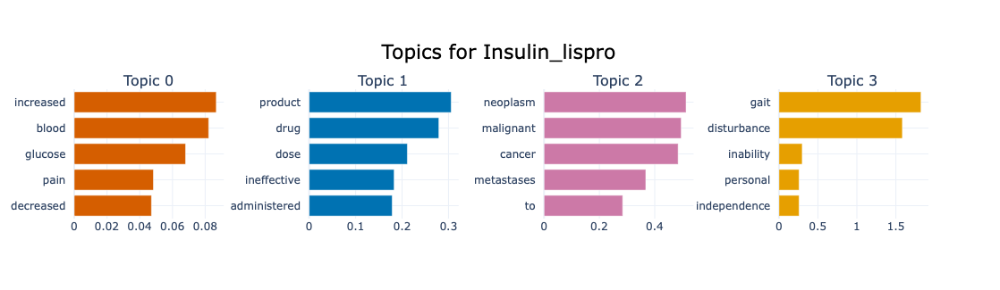

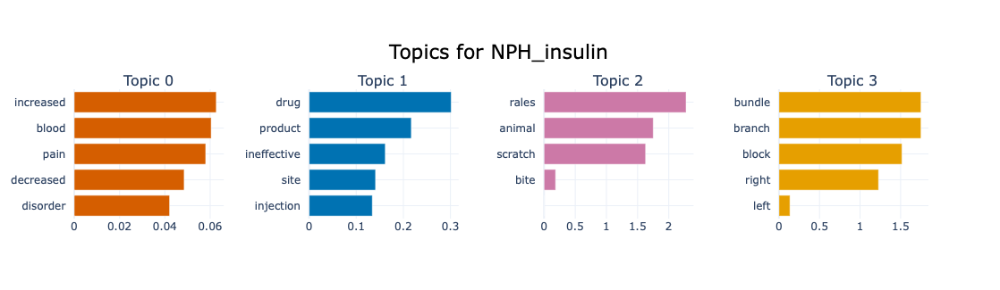

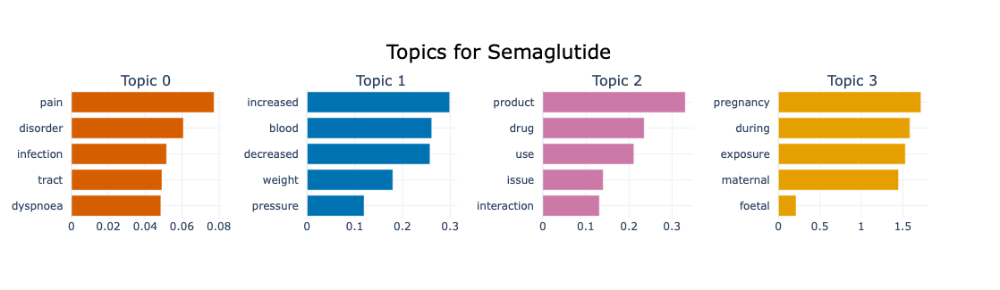

In [60]:
# Visualising topic words barchart

# Iterate over each medicine
reduced_models = {}  # Store reduced models for each medicine

for medicine in combined_df["medicine"].unique():
    # Filter the dataset for the current medicine
    medicine_data = combined_df[combined_df["medicine"] == medicine]
    medicine_docs = medicine_data["pt"].tolist()
    
    # Fit a new BERTopic model for this subset of documents
    medicine_model = BERTopic()
    topics, probs = medicine_model.fit_transform(medicine_docs)
    
    # Reduce topics to 5 (or fewer)
    reduced_model = medicine_model.reduce_topics(medicine_docs, nr_topics=5)
    reduced_models[medicine] = reduced_model  # Store the reduced model
    
    # Visualize the reduced topics
    fig = reduced_model.visualize_barchart(top_n_topics=5)
    fig.update_layout(
        title_text=f"Topics for {medicine}",
        title_x=0.5
    )
    fig.show()

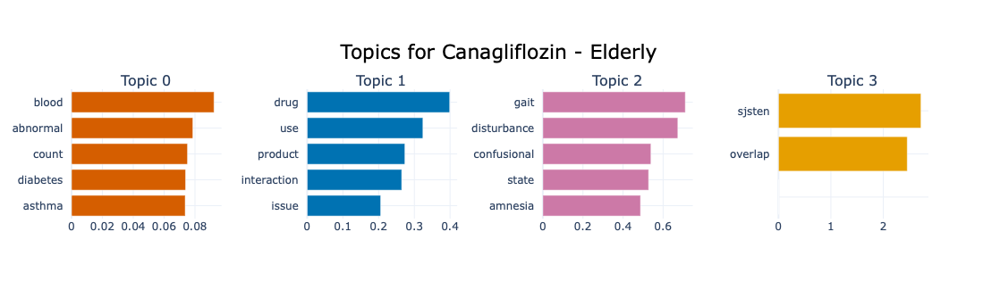

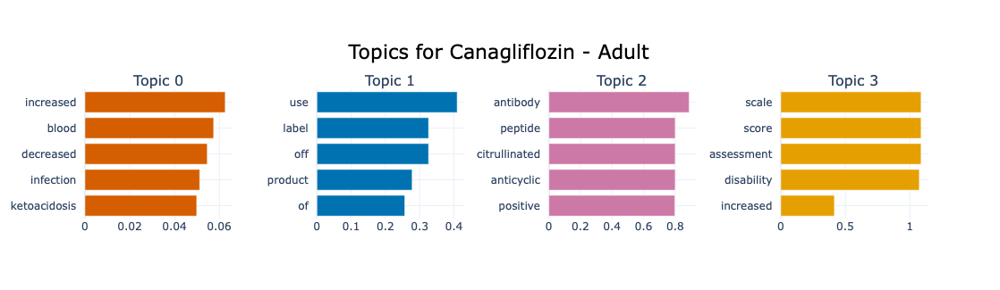

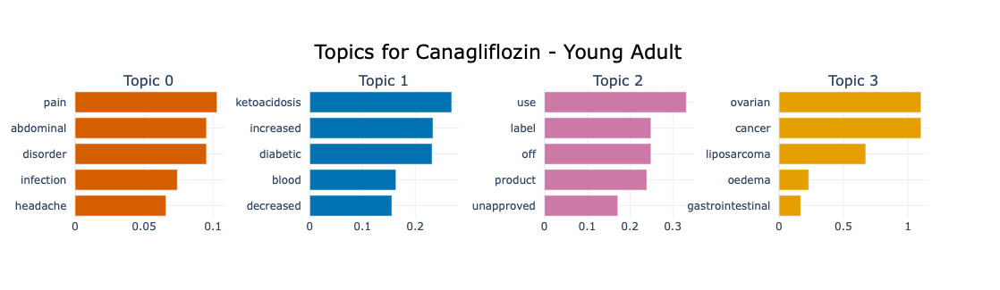

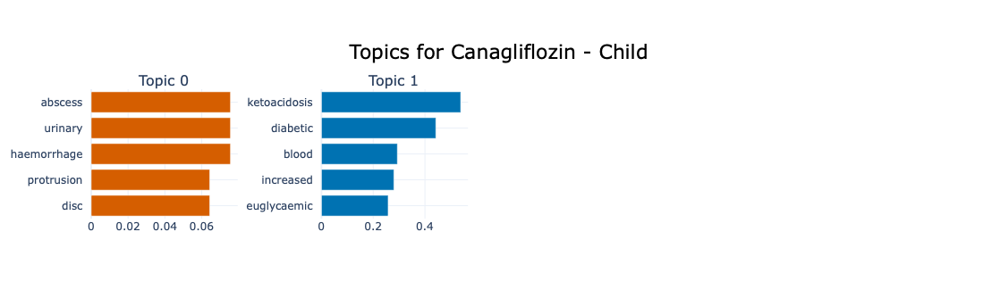

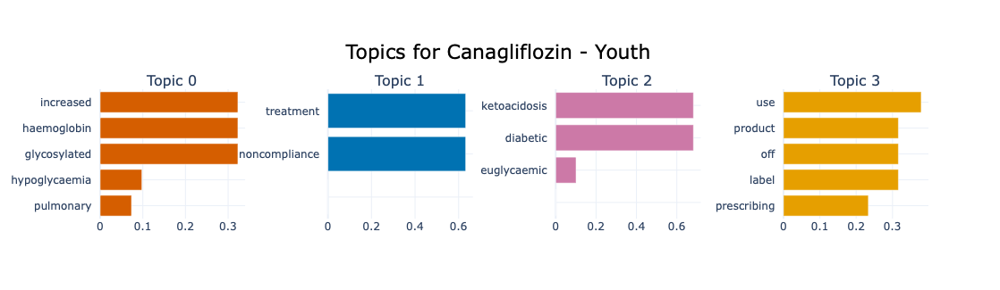

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

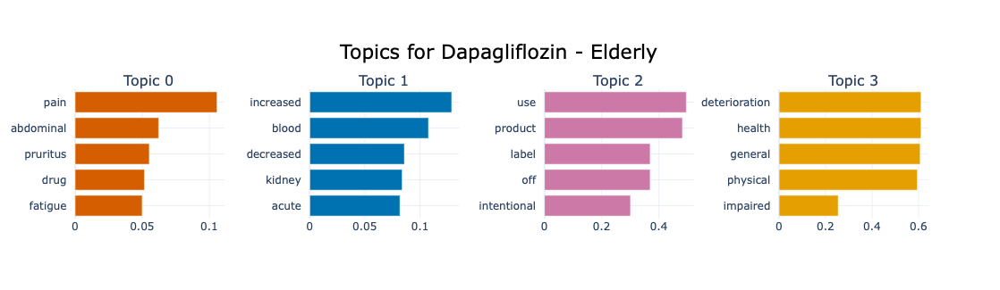

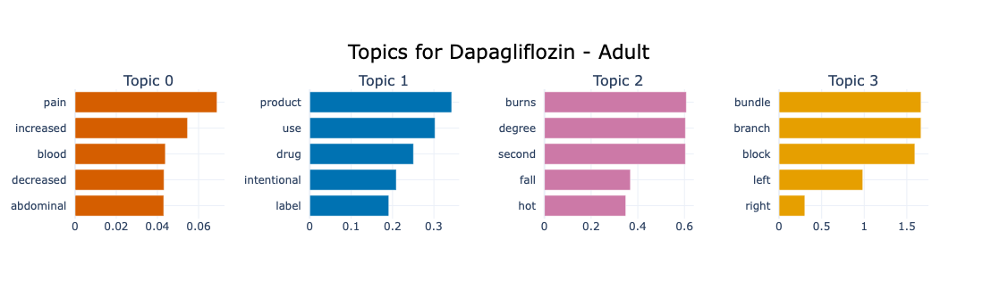

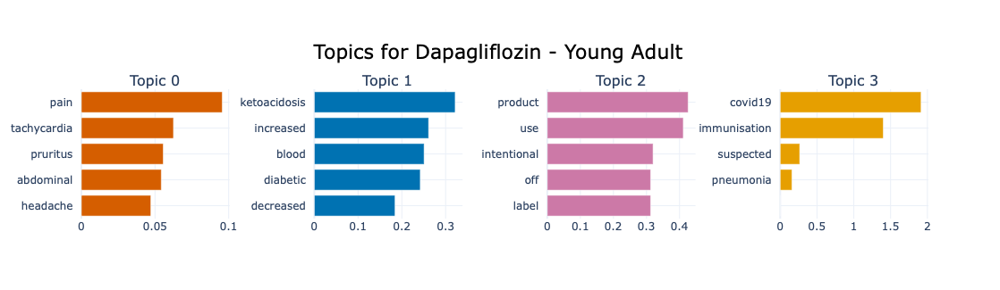

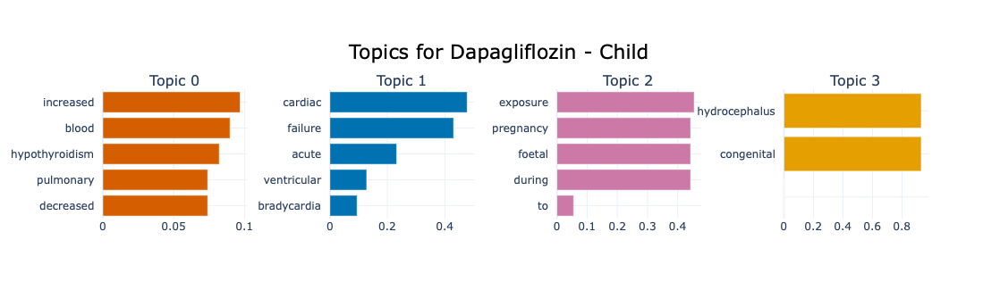

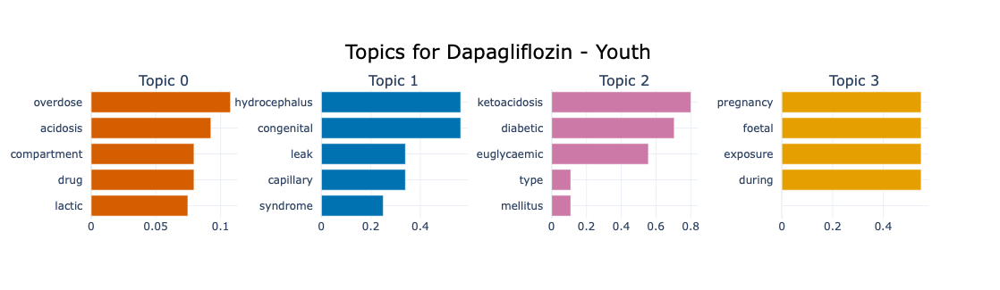

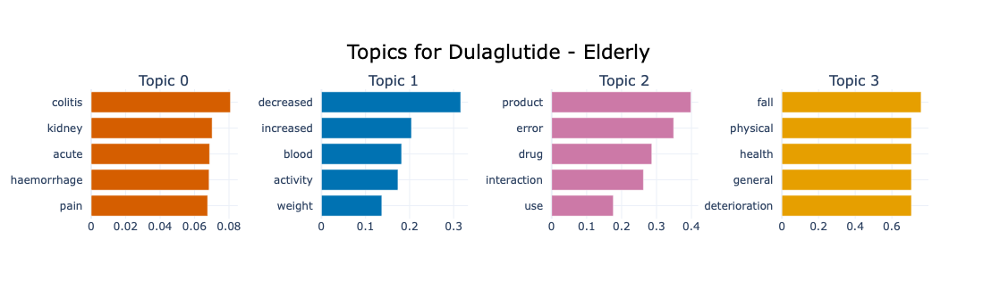

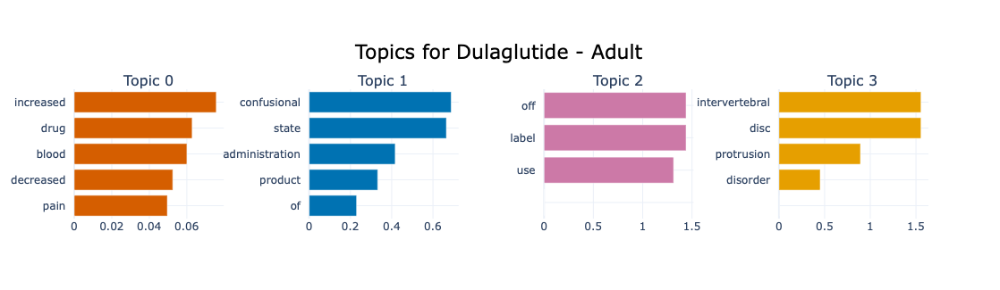

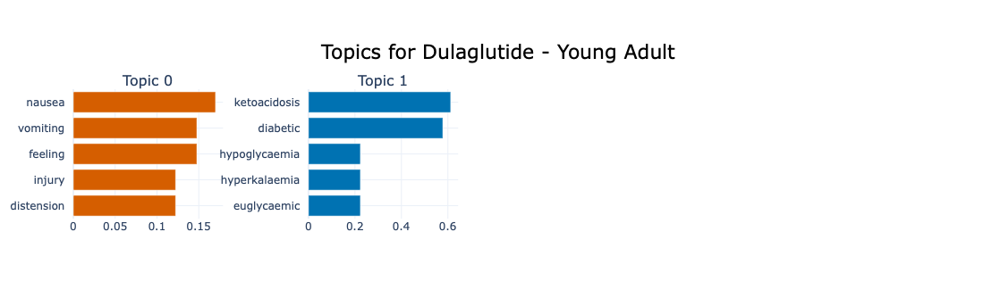

No valid topics for Medicine: Dulaglutide, Age Group: Child


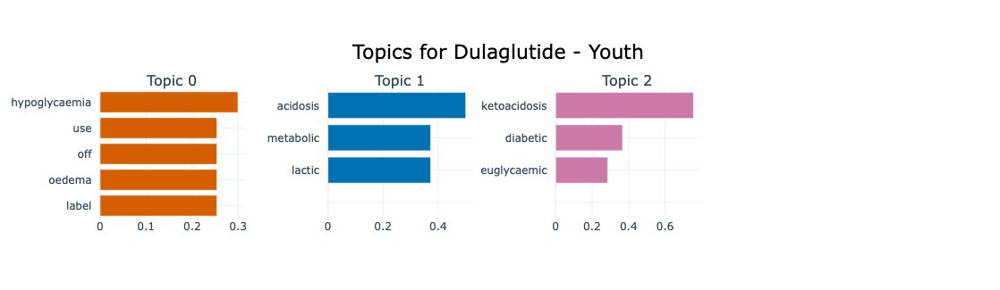

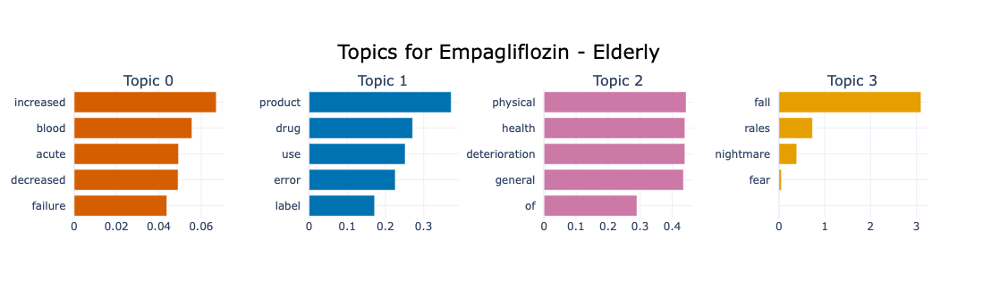

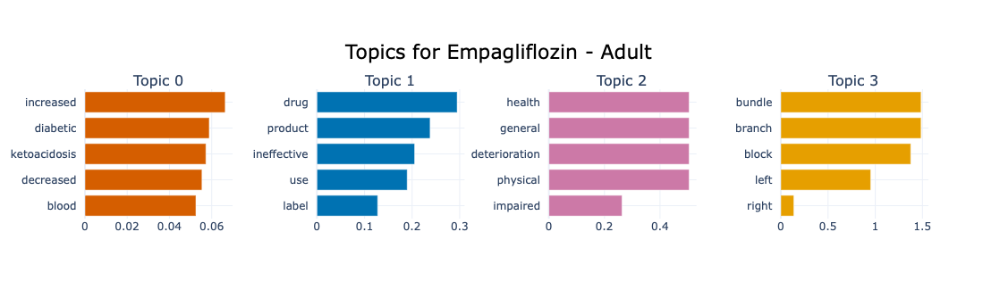

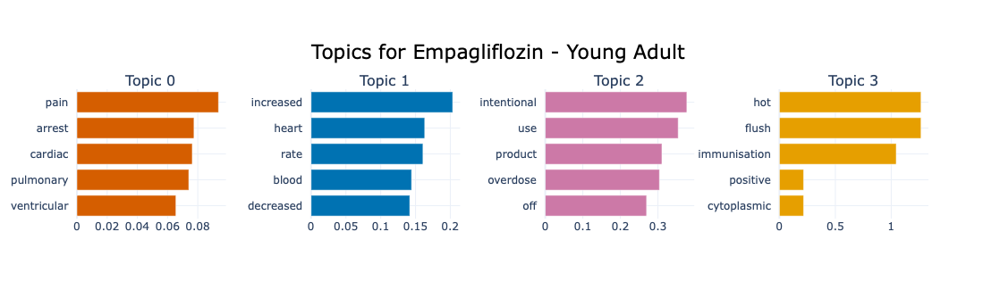

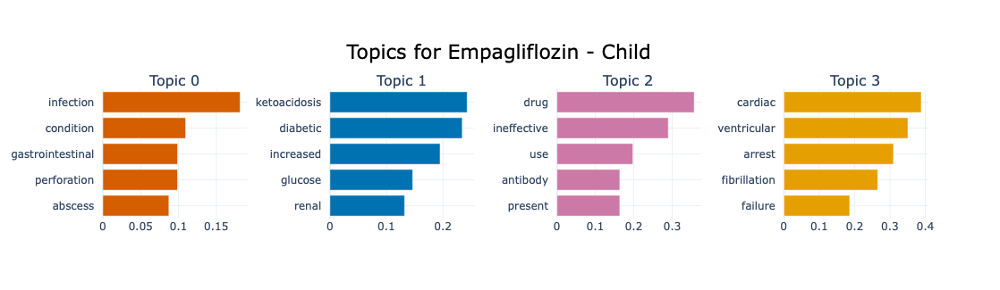

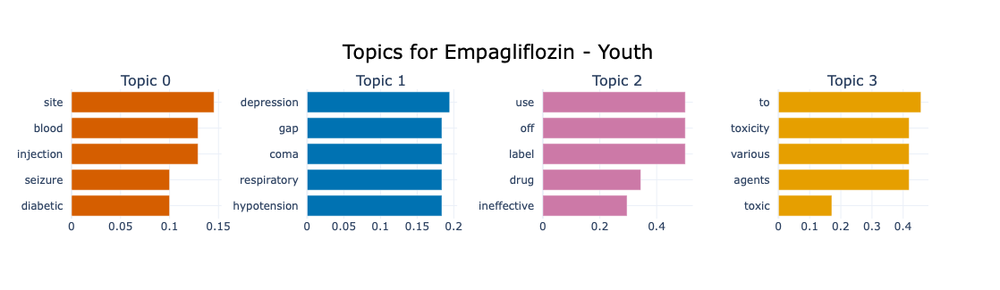

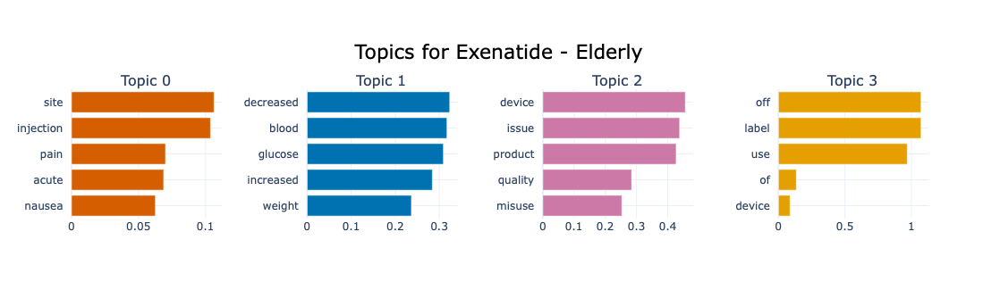

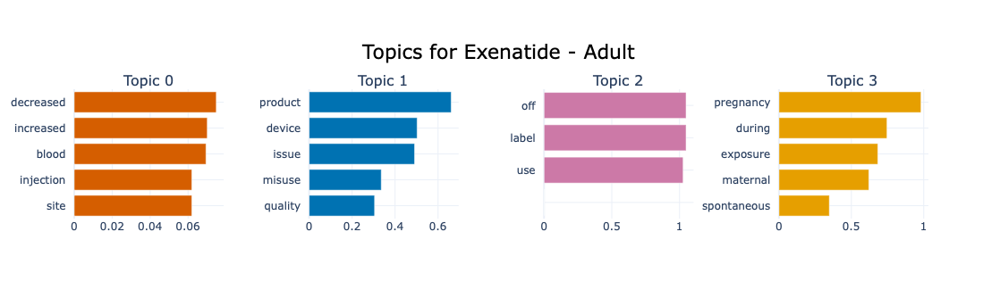

No valid topics for Medicine: Exenatide, Age Group: Young Adult
No valid topics for Medicine: Exenatide, Age Group: Child


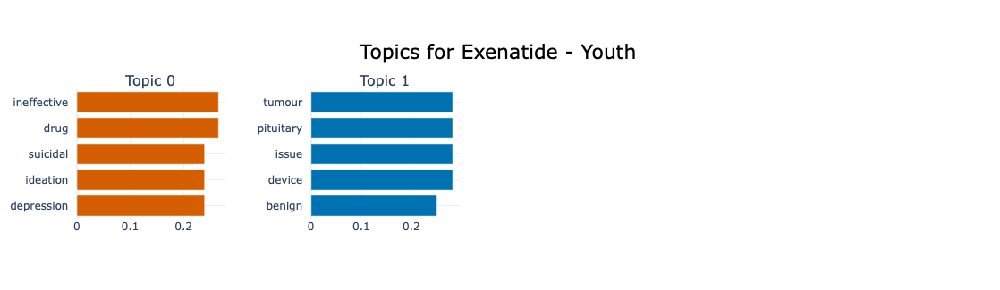

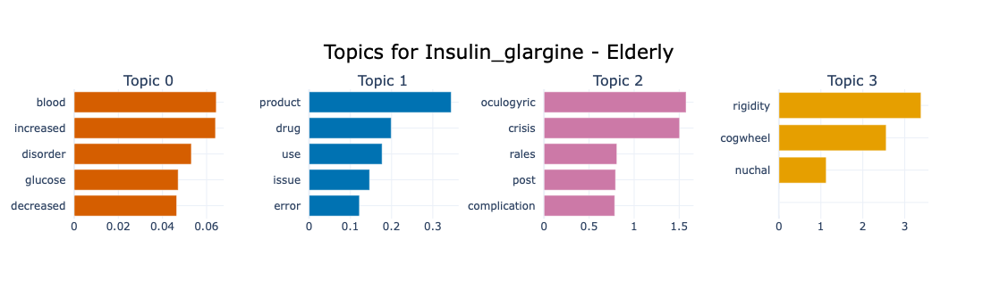

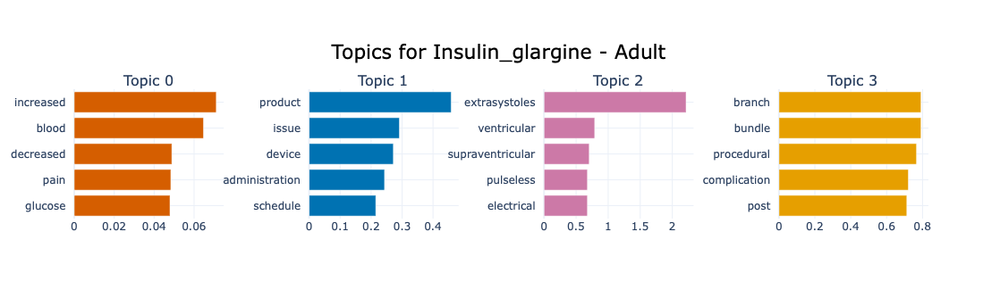

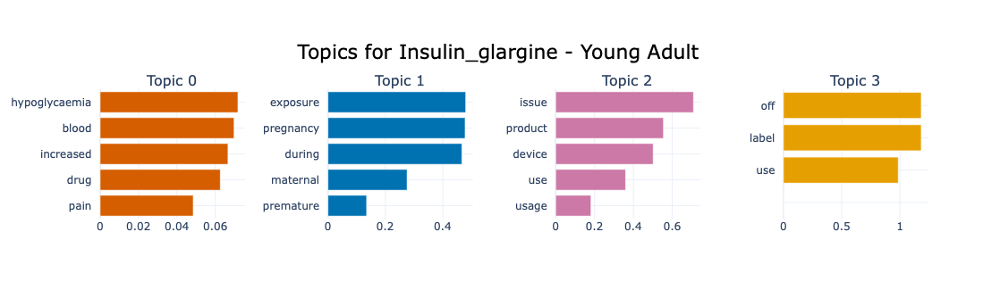

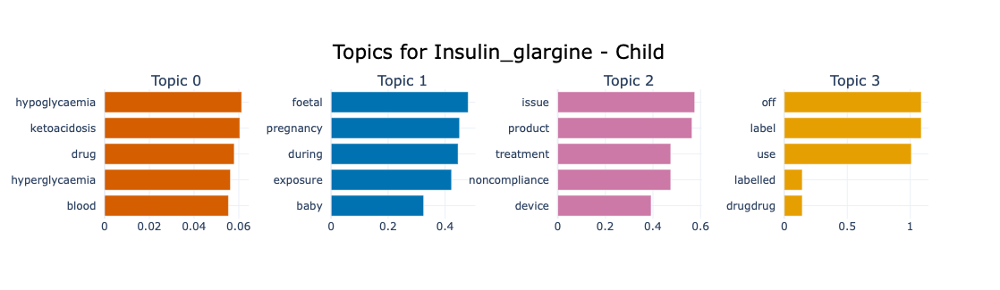

...

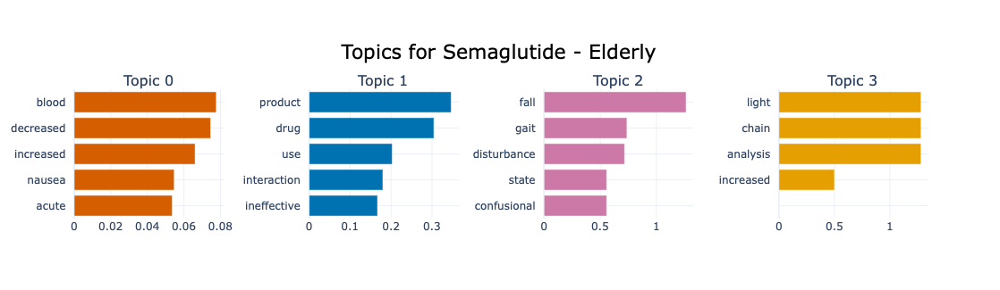

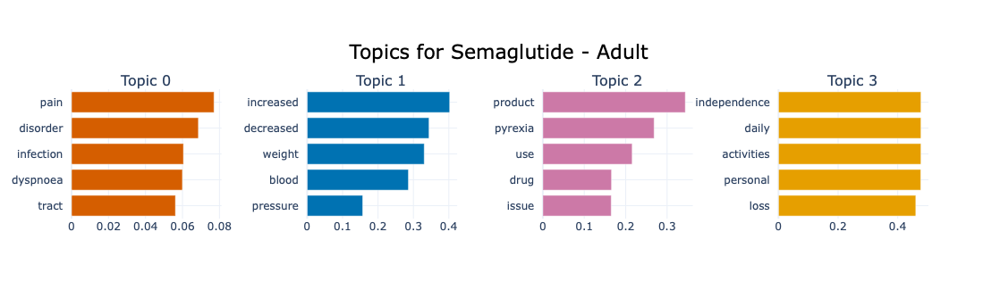

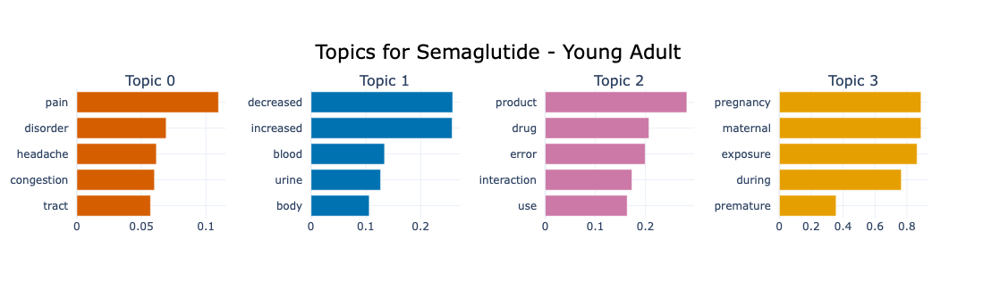

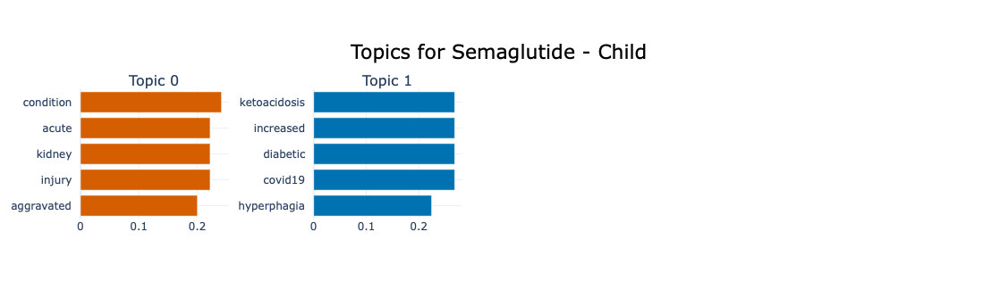

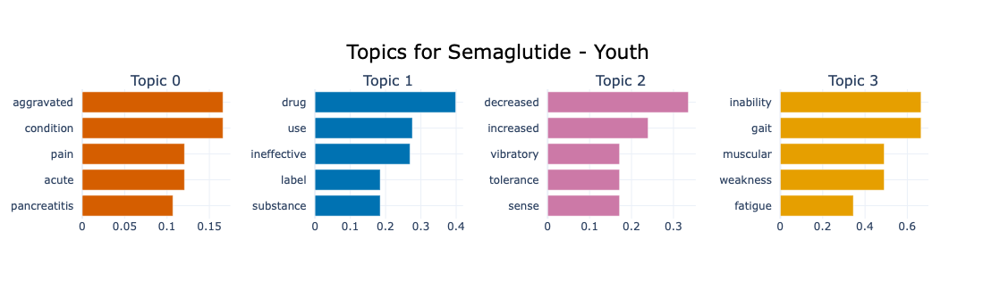

In [61]:
'''
This code is used to display topic word scores for all medicine by age group
'''


from bertopic import BERTopic

# Dictionary to store reduced models for each combination
reduced_models_by_age_group = {}

# Iterate over each medicine and its age groups
for medicine in combined_df["medicine"].unique():
    reduced_models_by_age_group[medicine] = {}
    
    for age_group in combined_df["age_group"].unique():
        # Filter the dataset for the current medicine and age group
        subset_data = combined_df[
            (combined_df["medicine"] == medicine) & 
            (combined_df["age_group"] == age_group)
        ]
        
        # Skip if no data for this combination
        if subset_data.empty:
            continue
        
        # Extract documents
        subset_docs = subset_data["pt"].tolist()
        
        # Fit a new BERTopic model for this subset of documents
        age_group_model = BERTopic()
        topics, probs = age_group_model.fit_transform(subset_docs)
        
        # Reduce topics to 5 (or fewer)
        reduced_model = age_group_model.reduce_topics(subset_docs, nr_topics=5)
        
        # Check if any topics remain (excluding outliers)
        topic_info = reduced_model.get_topic_info()
        remaining_topics = topic_info[topic_info["Topic"] != -1]
        if remaining_topics.empty:
            print(f"No valid topics for Medicine: {medicine}, Age Group: {age_group}")
            continue  # Skip visualization if no topics remain
        
        # Store the reduced model
        reduced_models_by_age_group[medicine][age_group] = reduced_model
        
        # Visualize the reduced topics
        fig = reduced_model.visualize_barchart(top_n_topics=min(5, len(remaining_topics)))
        fig.update_layout(
            title_text=f"Topics for {medicine} - {age_group}",
            title_x=0.5
        )
        fig.show()

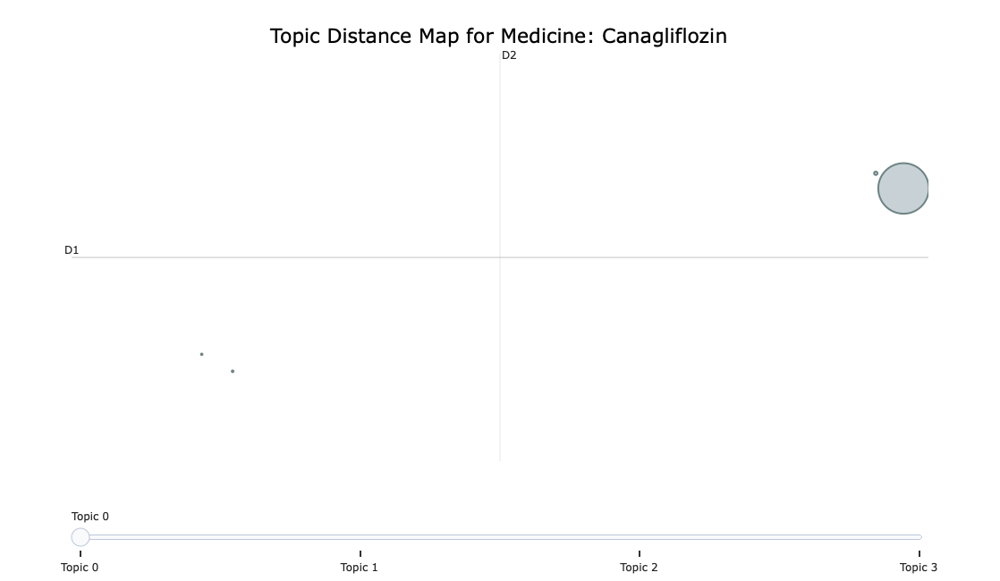

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

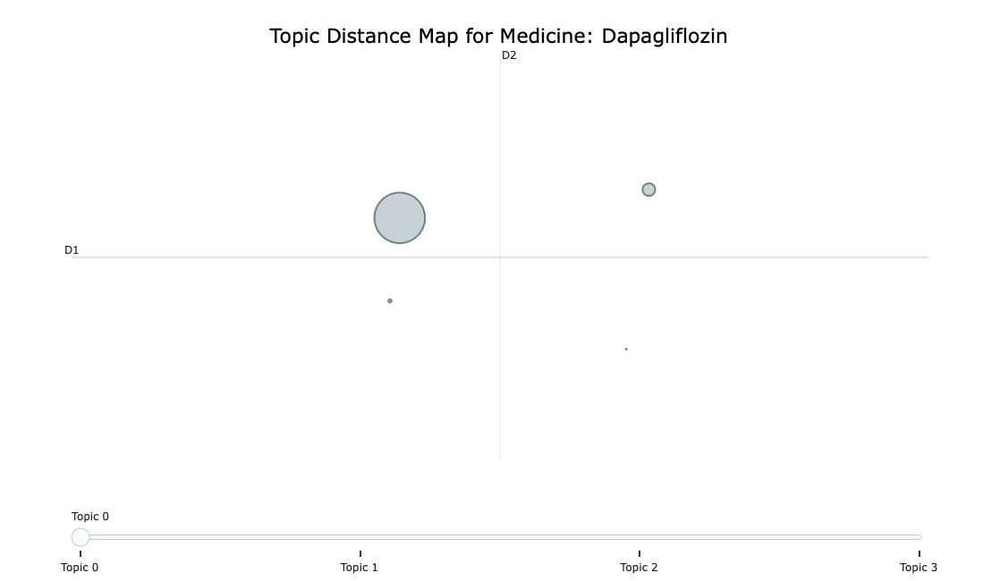

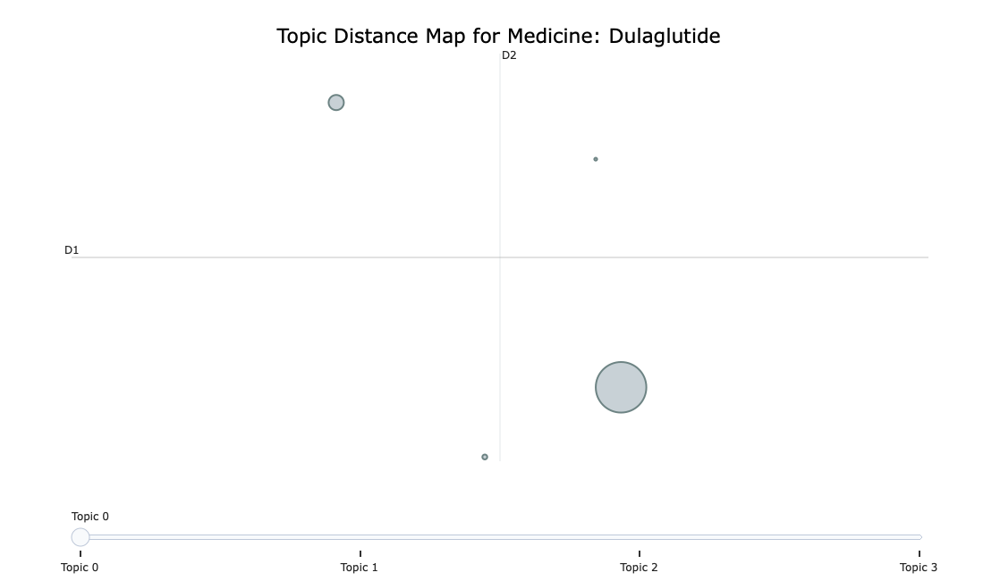

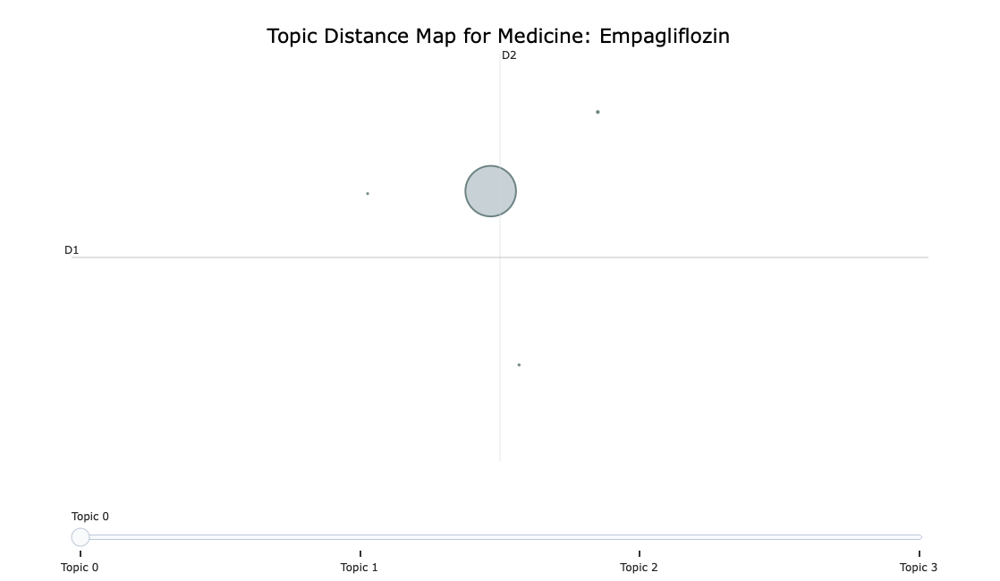

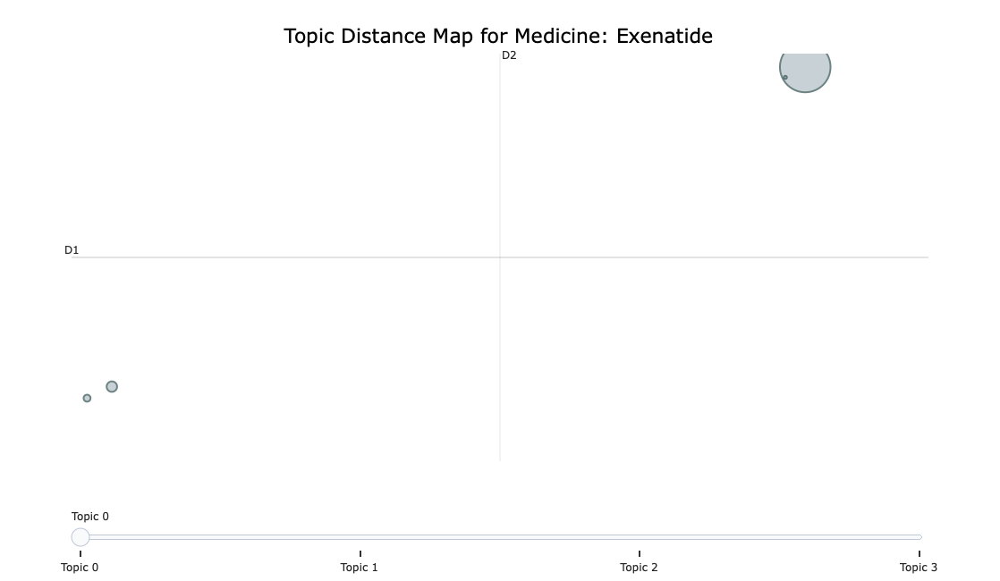

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

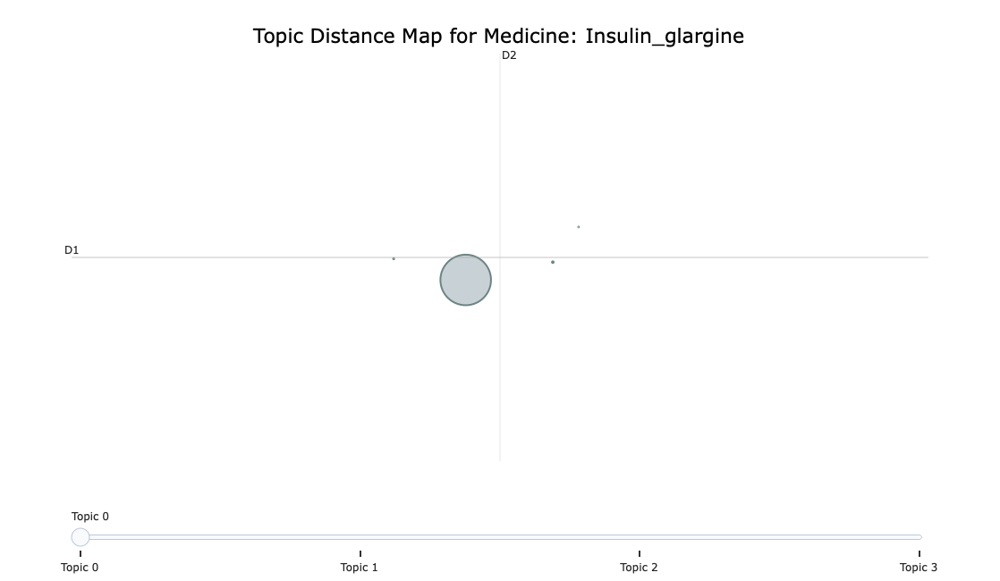

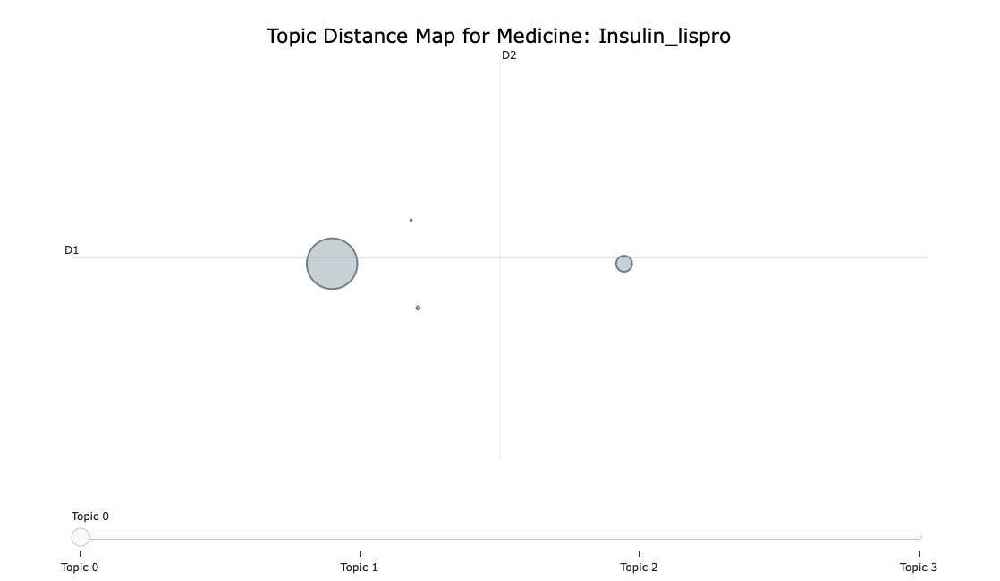

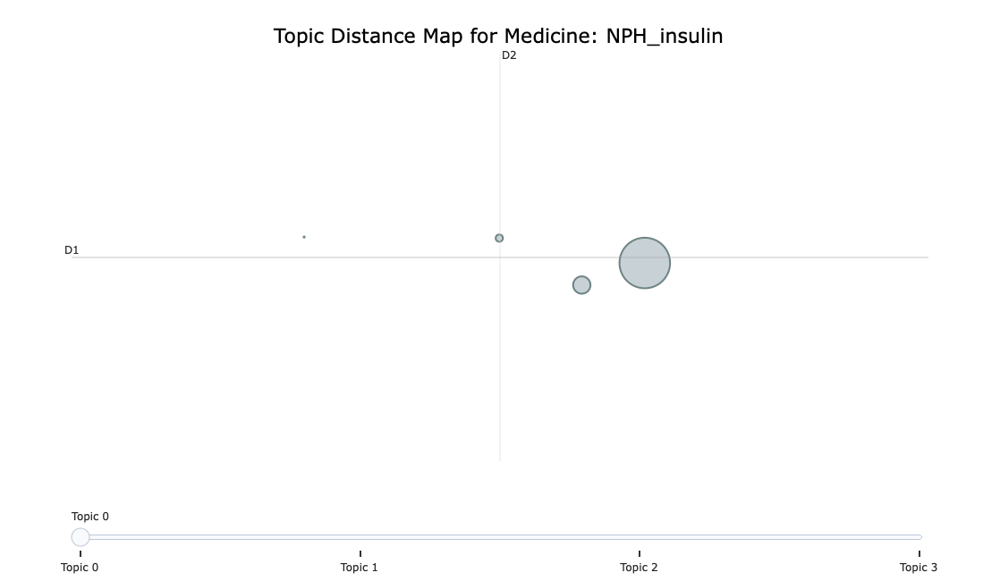

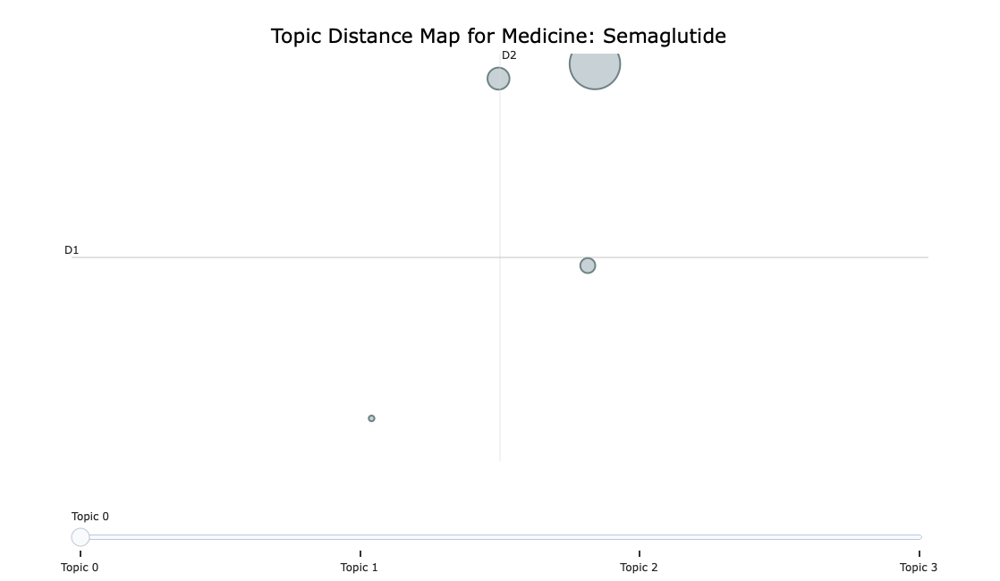

In [59]:
# Visualising distance maps for all medicines
for medicine, reduced_model in reduced_models_by_age_group.items():
    # Combine all age groups for this medicine into a single reduced model
    all_docs = combined_df[combined_df["medicine"] == medicine]["pt"].tolist()
    medicine_model = BERTopic()
    topics, probs = medicine_model.fit_transform(all_docs)
    
    # Reduce to 5 topics for the entire medicine
    reduced_medicine_model = medicine_model.reduce_topics(all_docs, nr_topics=5)
    
    # Generate the distance map
    fig = reduced_medicine_model.visualize_topics()
    fig.update_layout(
        title_text=f"Topic Distance Map for Medicine: {medicine}",
        title_x=0.5
    )
    fig.show()

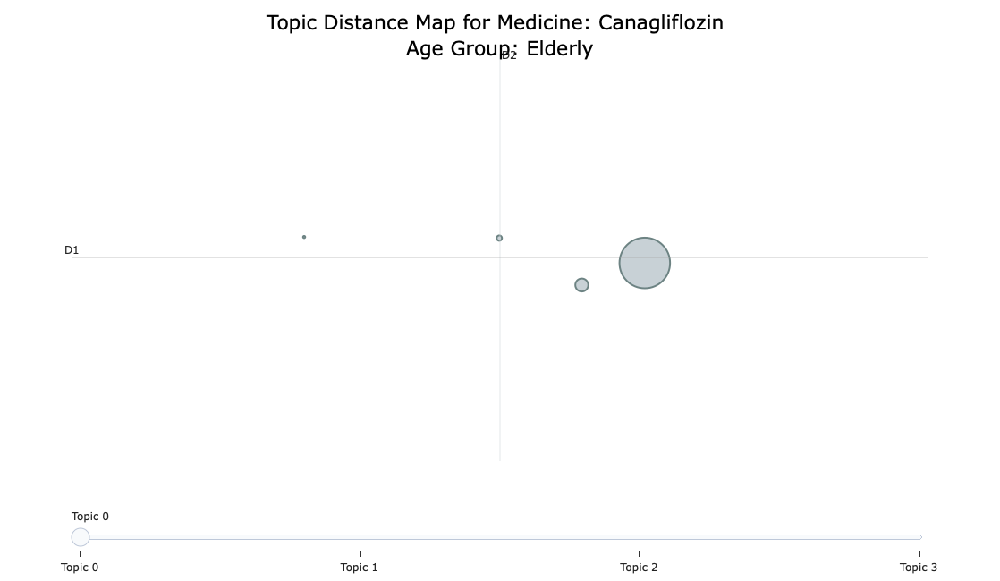

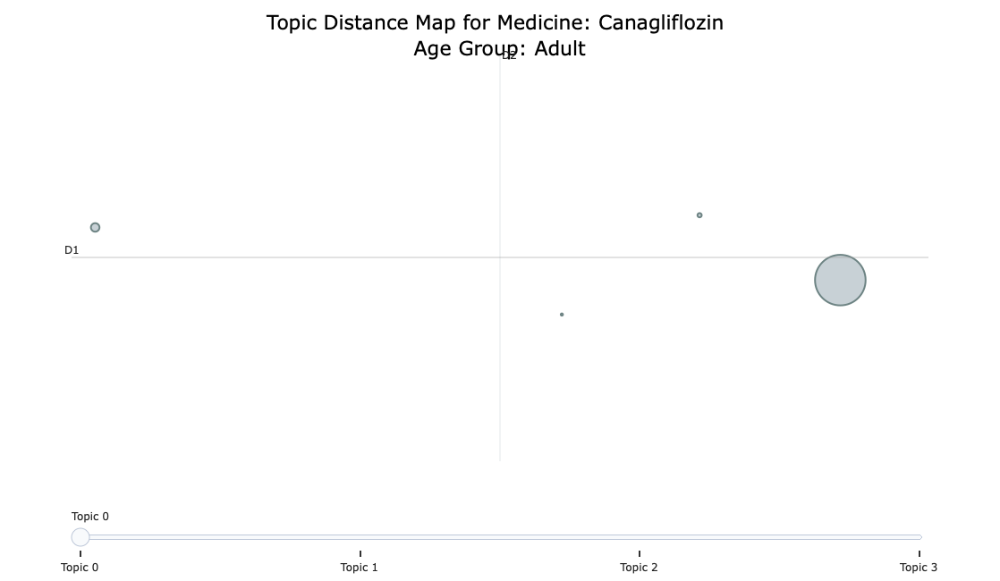

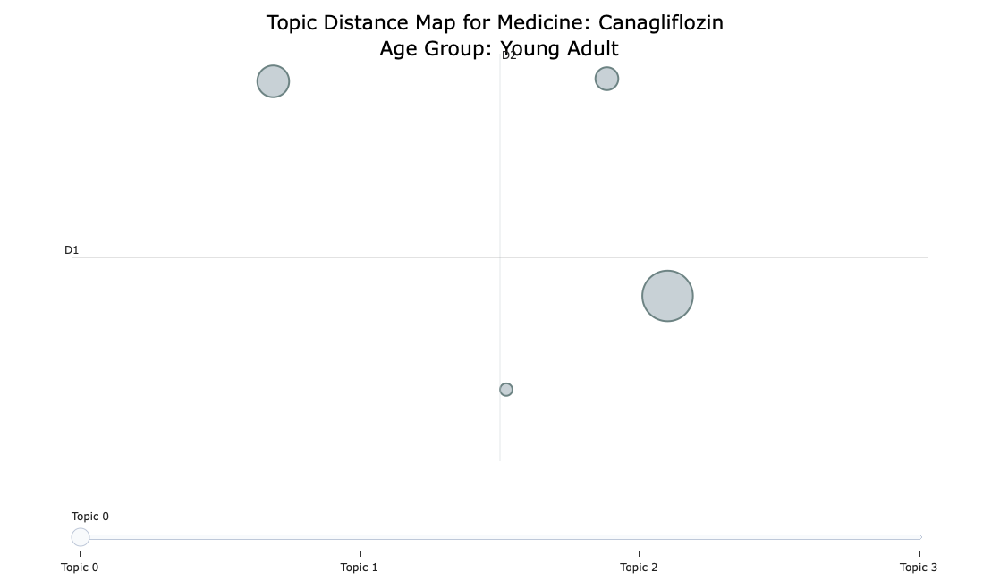

ValueError: zero-size array to reduction operation maximum which has no identity

In [69]:
'''
This topic is to visualise intertopic distance map for all medicine by age group
'''


for medicine, age_groups in reduced_models_by_age_group.items():
    for age_group, reduced_model in age_groups.items():
        # Skip combinations with no topics
        if reduced_model is None:
            continue
        
        # Generate the distance map for the reduced topics
        fig = reduced_model.visualize_topics()
        fig.update_layout(
            title_text=f"Topic Distance Map for Medicine: {medicine} <br> Age Group: {age_group}",
            title_x=0.5
        )
        fig.show()

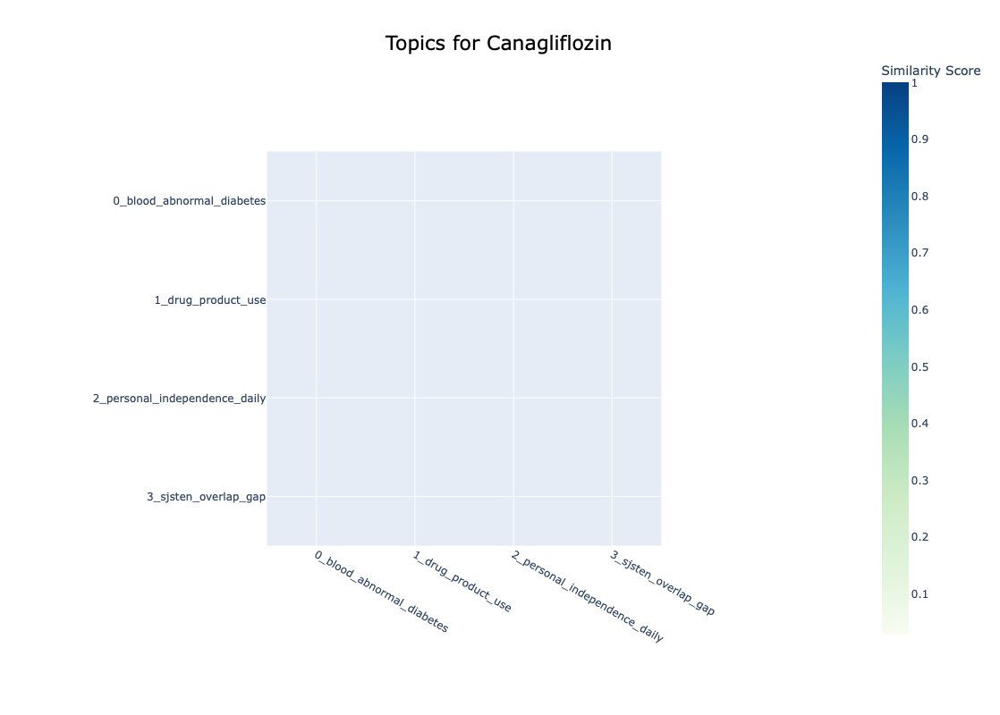

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

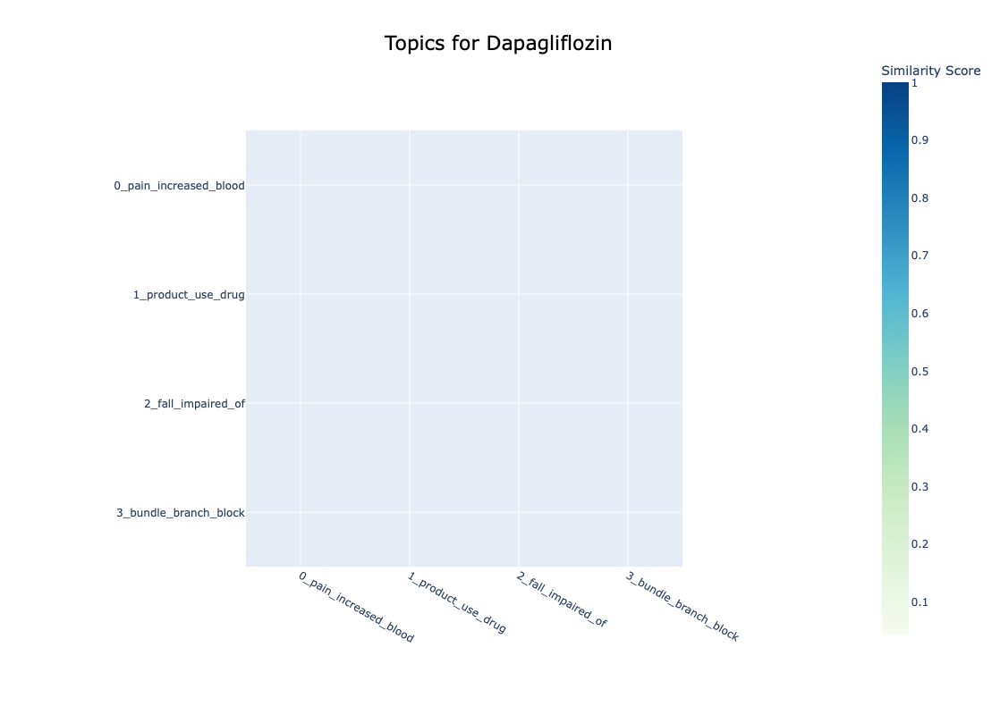

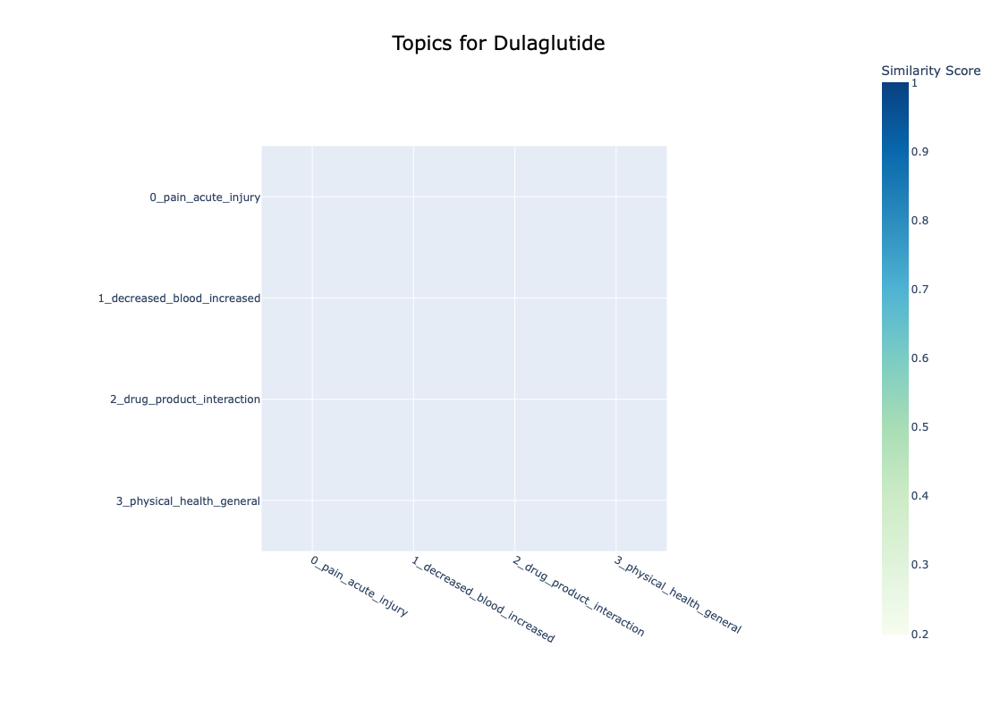

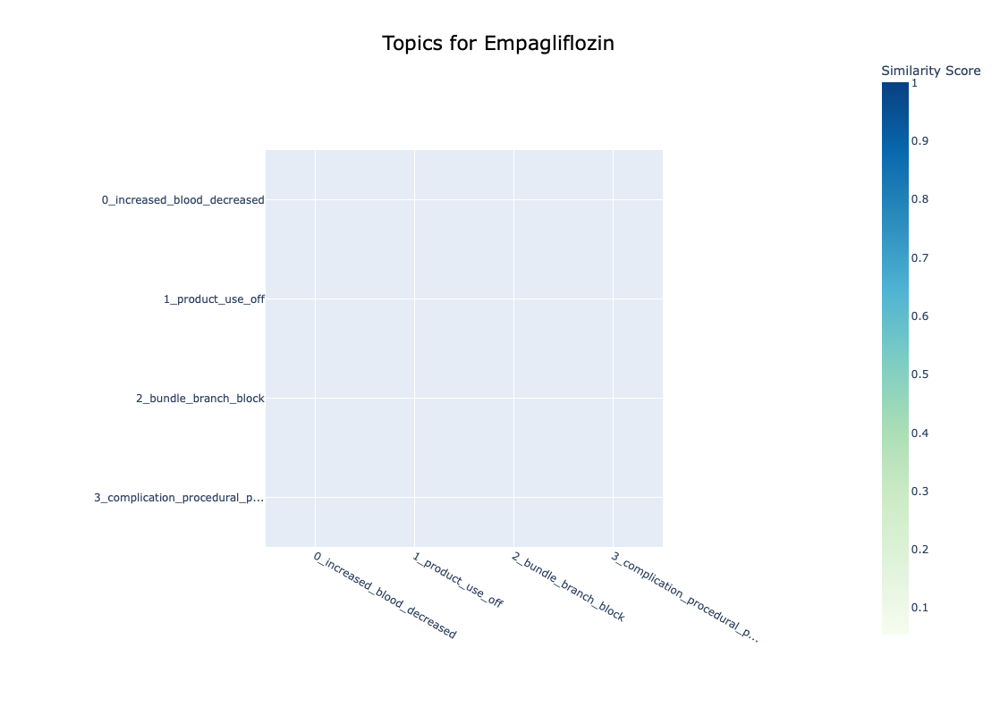

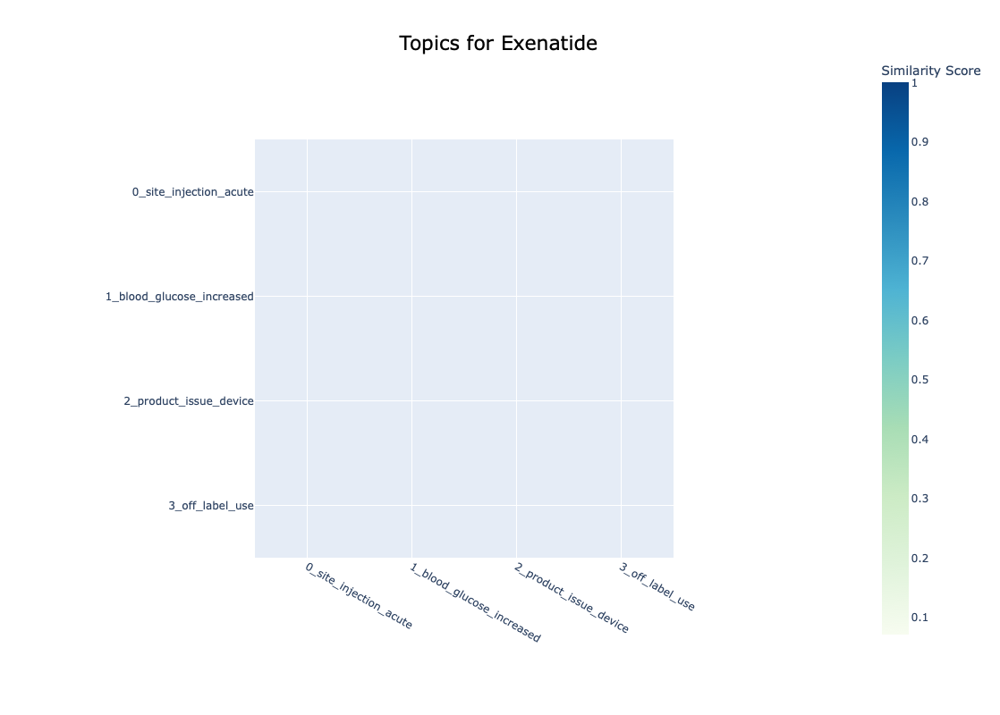

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

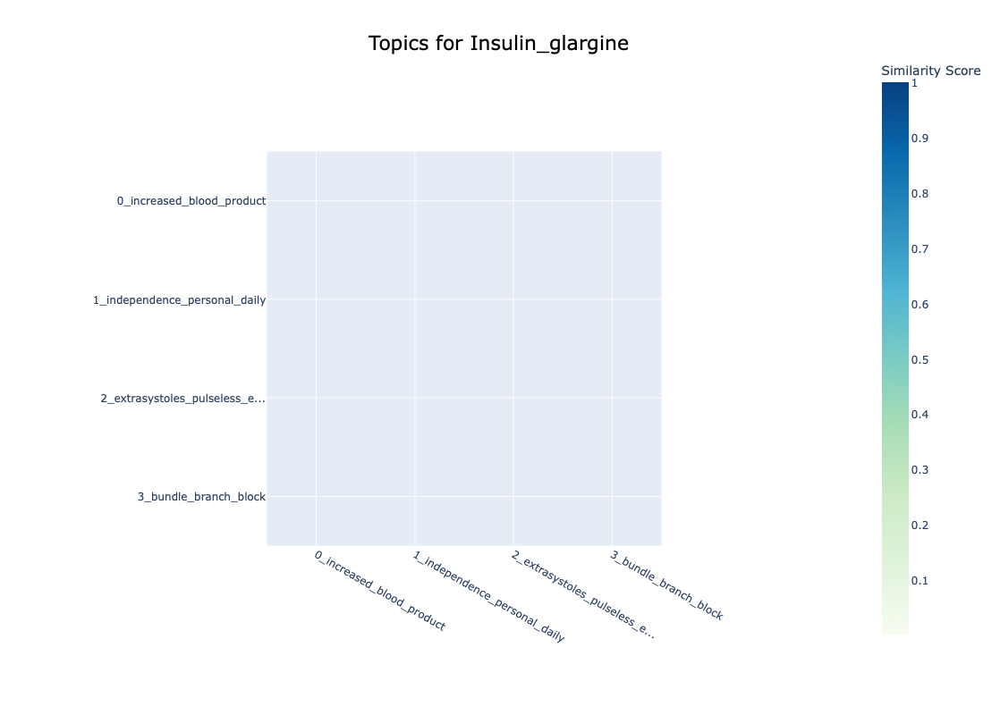

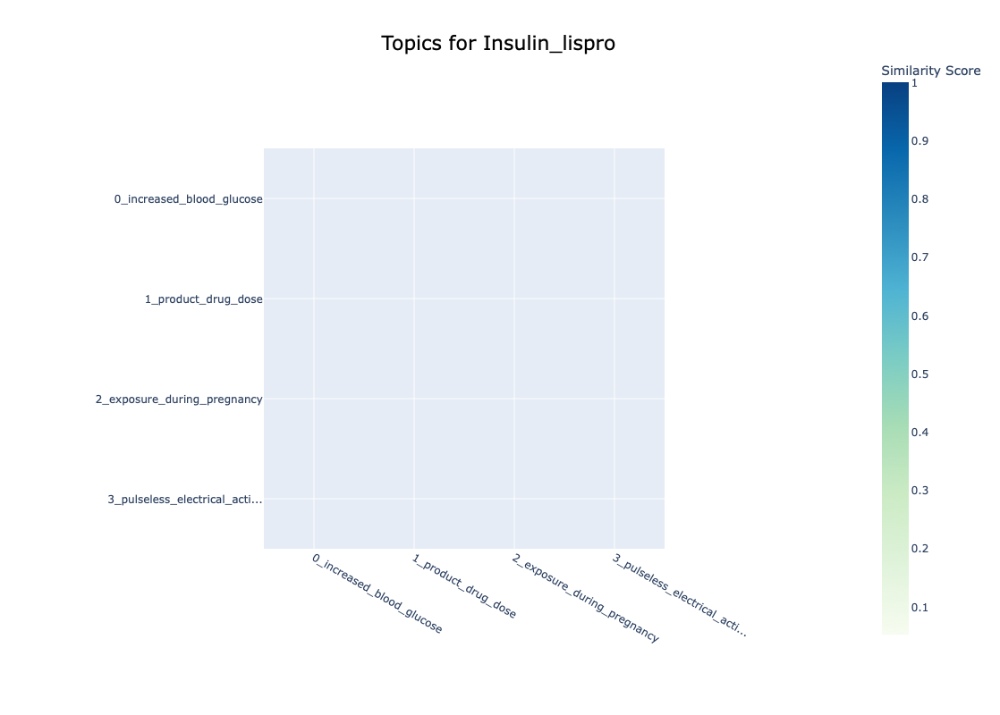

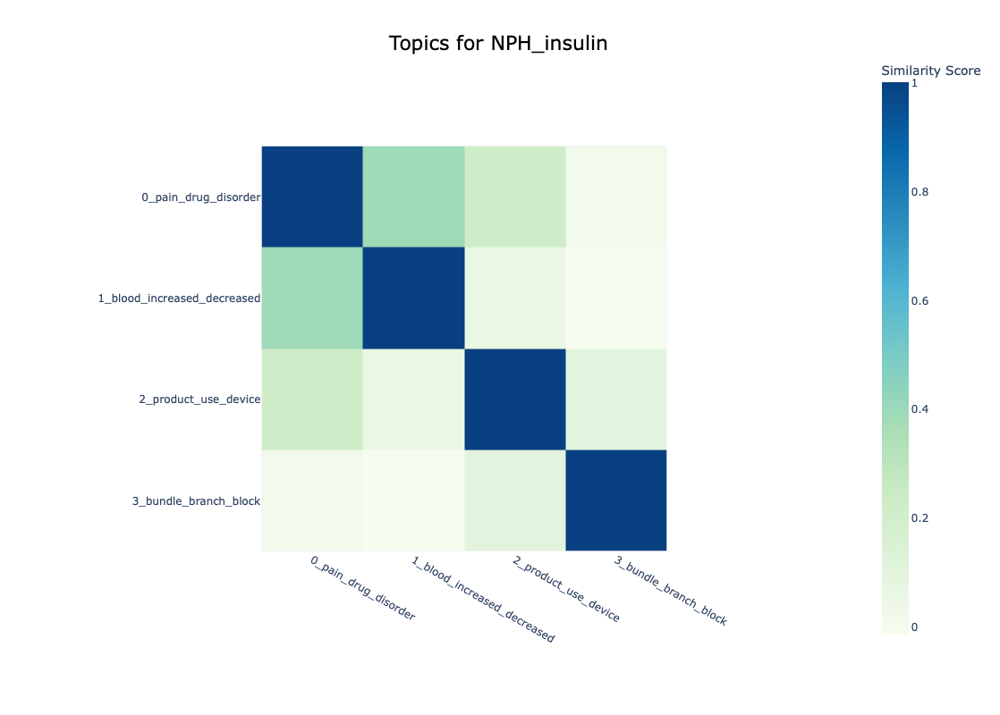

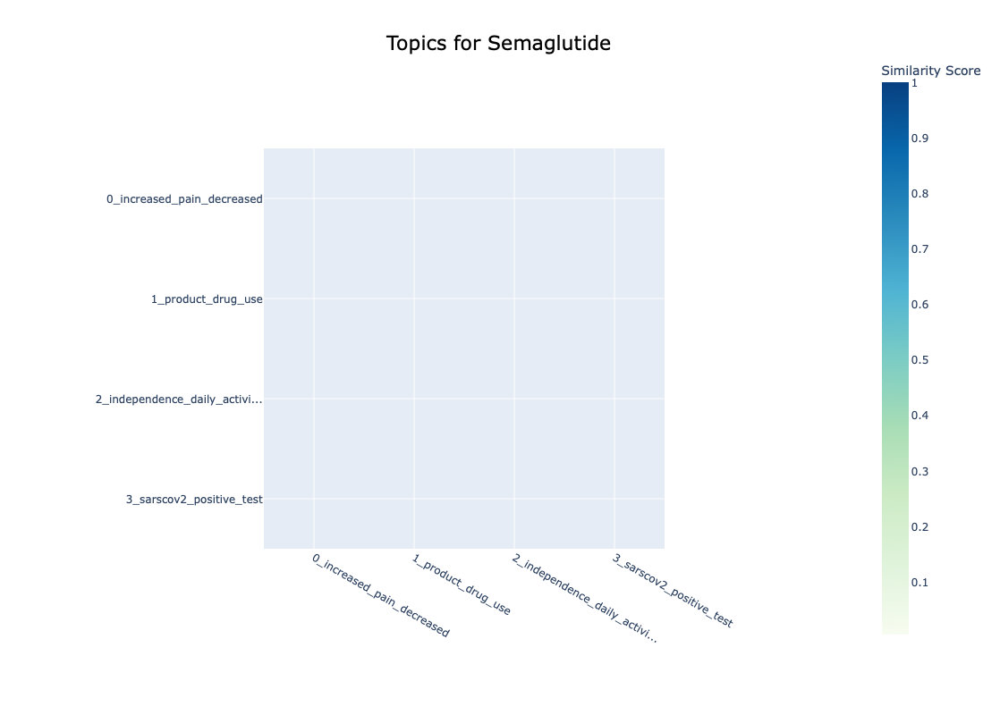

In [74]:
# Visualising topic words barchart

# Iterate over each medicine
reduced_models = {}  # Store reduced models for each medicine

for medicine in combined_df["medicine"].unique():
    # Filter the dataset for the current medicine
    medicine_data = combined_df[combined_df["medicine"] == medicine]
    medicine_docs = medicine_data["pt"].tolist()
    
    # Fit a new BERTopic model for this subset of documents
    medicine_model = BERTopic()
    topics, probs = medicine_model.fit_transform(medicine_docs)
    
    # Reduce topics to 5 (or fewer)
    reduced_model = medicine_model.reduce_topics(medicine_docs, nr_topics=5)
    reduced_models[medicine] = reduced_model  # Store the reduced model
    
    # Visualize the reduced topics
    fig = reduced_model.visualize_heatmap(top_n_topics=5)
    fig.update_layout(
        title_text=f"Topics for {medicine}",
        title_x=0.5
    )
    fig.show()

In [38]:
# Ensure topics are added to combined_df
combined_df["topic"] = topic_model.transform(combined_df["pt"].tolist())[0]

In [70]:
# Topics for each medicine by age groups
# Placeholder for top topics per medicine and age group
top_topics_per_medicine_age_group = defaultdict(lambda: defaultdict(list))

# Iterate over the reduced models
for medicine, age_groups in reduced_models_by_age_group.items():
    for age_group, reduced_model in age_groups.items():
        # Skip combinations with no valid reduced model
        if reduced_model is None:
            continue
        
        # Get topic info from the reduced model
        topic_info = reduced_model.get_topic_info()
        
        # Exclude the outlier (-1) and select up to 5 topics
        valid_topics = topic_info[topic_info["Topic"] != -1]
        top_topics = valid_topics.head(5)["Topic"].tolist()
        
        # Store the top topics for this medicine and age group
        top_topics_per_medicine_age_group[medicine][age_group] = top_topics

# Display the top topics for each medicine and age group
for medicine, age_group_topics in top_topics_per_medicine_age_group.items():
    print(f"Medicine: {medicine}")
    for age_group, topics in age_group_topics.items():
        print(f"  Age Group: {age_group}")
        print(f"  Top 5 Topics (Reduced): {topics}")

Medicine: Canagliflozin
  Age Group: Elderly
  Top 5 Topics (Reduced): [0, 1, 2, 3]
  Age Group: Adult
  Top 5 Topics (Reduced): [0, 1, 2, 3]
  Age Group: Young Adult
  Top 5 Topics (Reduced): [0, 1, 2, 3]
  Age Group: Child
  Top 5 Topics (Reduced): [0, 1]
  Age Group: Youth
  Top 5 Topics (Reduced): [0, 1, 2, 3]
Medicine: Dapagliflozin
  Age Group: Elderly
  Top 5 Topics (Reduced): [0, 1, 2, 3]
  Age Group: Adult
  Top 5 Topics (Reduced): [0, 1, 2, 3]
  Age Group: Young Adult
  Top 5 Topics (Reduced): [0, 1, 2, 3]
  Age Group: Child
  Top 5 Topics (Reduced): [0, 1, 2, 3]
  Age Group: Youth
  Top 5 Topics (Reduced): [0, 1, 2, 3]
Medicine: Dulaglutide
  Age Group: Elderly
  Top 5 Topics (Reduced): [0, 1, 2, 3]
  Age Group: Adult
  Top 5 Topics (Reduced): [0, 1, 2, 3]
  Age Group: Young Adult
  Top 5 Topics (Reduced): [0, 1]
  Age Group: Youth
  Top 5 Topics (Reduced): [0, 1, 2]
Medicine: Empagliflozin
  Age Group: Elderly
  Top 5 Topics (Reduced): [0, 1, 2, 3]
  Age Group: Adult
  Top 

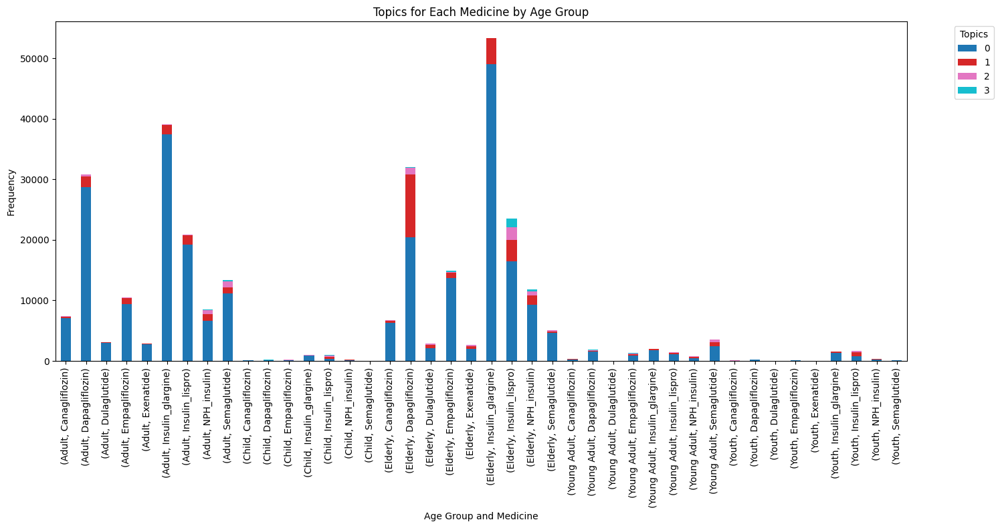

In [72]:
'''
This code is used to combine all the medicines by age group and visualise them in a bar chart
'''

import pandas as pd
import matplotlib.pyplot as plt

# Prepare data for visualization
data = []

# Use the reduced models to calculate topic counts
for medicine, age_groups in reduced_models_by_age_group.items():
    for age_group, reduced_model in age_groups.items():
        # Skip combinations with no valid reduced model
        if reduced_model is None:
            continue
        
        # Get the topic frequencies from the reduced model
        topic_info = reduced_model.get_topic_info()
        valid_topics = topic_info[topic_info["Topic"] != -1]  # Exclude outlier
        top_topics = valid_topics.head(5)  # Limit to top 5 topics
        
        for _, row in top_topics.iterrows():
            data.append({
                "Medicine": medicine,
                "Age Group": age_group,
                "Topic": row["Topic"],
                "Count": row["Count"]
            })

# Convert to DataFrame
data_df = pd.DataFrame(data)

# Pivot data for stacked bar chart
pivot_df = data_df.pivot_table(
    index=["Age Group", "Medicine"], columns="Topic", values="Count", aggfunc="sum", fill_value=0
)

# Flatten the multi-index for easier plotting
pivot_df.reset_index(inplace=True)
pivot_df.set_index(["Age Group", "Medicine"], inplace=True)

# Plot stacked bar chart
pivot_df.plot(kind="bar", stacked=True, figsize=(15, 8), colormap="tab10")
plt.title("Topics for Each Medicine by Age Group")
plt.xlabel("Age Group and Medicine")
plt.ylabel("Frequency")
plt.legend(title="Topics", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

In [73]:
import pandas as pd
from scipy.stats import chi2_contingency

# Prepare a contingency table for reduced topics
contingency_table = pd.DataFrame()

# Iterate over reduced models for medicines and age groups
for medicine, age_groups in reduced_models_by_age_group.items():
    for age_group, reduced_model in age_groups.items():
        # Skip combinations with no valid reduced model
        if reduced_model is None:
            continue
        
        # Get topic information from the reduced model
        topic_info = reduced_model.get_topic_info()
        valid_topics = topic_info[topic_info["Topic"] != -1]  # Exclude outliers
        
        # Add topic counts to the contingency table
        col_name = f"{medicine}_{age_group}"
        contingency_table[col_name] = valid_topics.set_index("Topic")["Count"]

# Fill missing values with 0 (for topics not present in certain combinations)
contingency_table = contingency_table.fillna(0)

# Perform the chi-square test
chi2, p, dof, expected = chi2_contingency(contingency_table)

# Display results
print("Chi-Square Statistic:", chi2)
print("Degrees of Freedom:", dof)
print("P-Value:", p)

# Display the expected frequencies
expected_df = pd.DataFrame(expected, index=contingency_table.index, columns=contingency_table.columns)
print("\nExpected Frequencies:\n", expected_df)

Chi-Square Statistic: 49431.532961629855
Degrees of Freedom: 123
P-Value: 0.0

Expected Frequencies:
        Canagliflozin_Elderly  Canagliflozin_Adult  Canagliflozin_Young Adult  \
Topic                                                                          
0                5753.083417          6277.869412                 303.644409   
1                 749.118708           817.451978                  39.538051   
2                 188.940998           206.175858                   9.972196   
3                  72.856877            79.502751                   3.845344   

       Canagliflozin_Child  Canagliflozin_Youth  Dapagliflozin_Elderly  \
Topic                                                                    
0               121.627872            86.755545           27274.412470   
1                15.837371            11.296586            3551.447309   
2                 3.994465             2.849199             895.737874   
3                 1.540292             1.098670